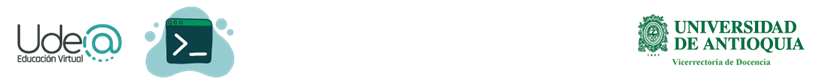

# <h1><center>Principal Component Analysis: Introduction and Applications</center></h1>

**Laboratorio Tratamiento de Señales III** *Práctica* 07

**Laboratorio: Laboratorio Segmentación de Imágenes**

*   Mateo Muñoz Arroyave
CC 1036676919

*   David Esteban Londoño Patiño
CC 1020465536

*Prof. Hernán Felipe García Arias*

*Prof. Pablo A. Alvarado*


Facultad de Ingeniería - Universidad de Antioquia

**2023-2**


In this tutorial, we explore what is perhaps one of the most broadly used of unsupervised algorithms, principal component analysis (PCA).
PCA is fundamentally a dimensionality reduction algorithm, but it can also be useful as a tool for visualization, for noise filtering, for feature extraction and engineering, and much more.
After a brief conceptual discussion of the PCA algorithm, we will see a couple examples of these further applications.

We begin with the standard imports:

In [ ]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()

## Introducing Principal Component Analysis

Principal component analysis is a fast and flexible unsupervised method for dimensionality reduction in data.
Its behavior is easiest to visualize by looking at a two-dimensional dataset.
Consider the following 200 points:

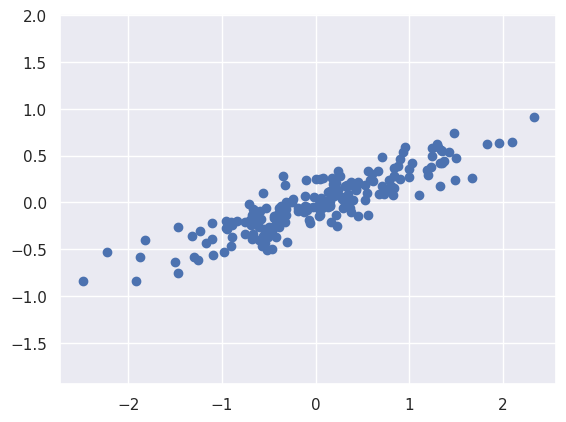

In [ ]:
rng = np.random.RandomState(1)
X = np.dot(rng.rand(2, 2), rng.randn(2, 200)).T
plt.scatter(X[:, 0], X[:, 1])
plt.axis('equal');

By eye, it is clear that there is a nearly linear relationship between the x and y variables.
The problem setting here is: rather than attempting to *predict* the y values from the x values, the unsupervised learning problem attempts to learn about the *relationship* between the x and y values.

In principal component analysis, this relationship is quantified by finding a list of the *principal axes* in the data, and using those axes to describe the dataset.
Using Scikit-Learn's ``PCA`` estimator, we can compute this as follows:

In [ ]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
pca.fit(X) # Entrenamos el modelo PCA (Calculamos los parámetros de proyección W, autovals, autovecs)
print(X.shape)

(200, 2)


The fit learns some quantities from the data, most importantly the "components" and "explained variance":

In [ ]:
print(pca.components_)

[[-0.94446029 -0.32862557]
 [-0.32862557  0.94446029]]


In [ ]:
print(pca.explained_variance_)

[0.7625315 0.0184779]


To see what these numbers mean, let's visualize them as vectors over the input data, using the "components" to define the direction of the vector, and the "explained variance" to define the squared-length of the vector:

[ 0.03351168 -0.00408072]


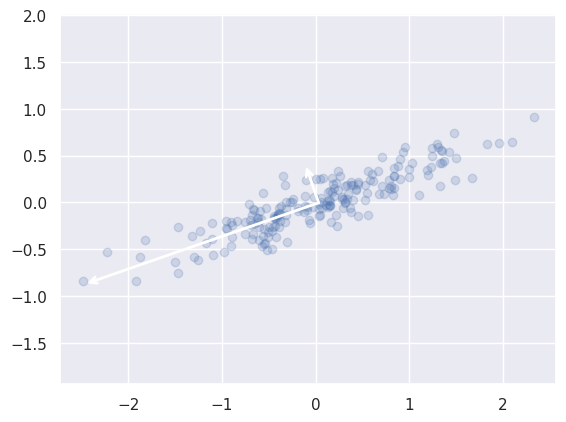

In [ ]:
def draw_vector(v0, v1, ax=None):
    ax = ax or plt.gca()
    arrowprops=dict(arrowstyle='->',
                    linewidth=2,
                    shrinkA=0, shrinkB=0)
    ax.annotate('', v1, v0, arrowprops=arrowprops)

# plot data
plt.scatter(X[:, 0], X[:, 1], alpha=0.2)
for length, vector in zip(pca.explained_variance_, pca.components_):
    v = vector * 3. * np.sqrt(length)
    #draw_vector(v*0.,  v)
    draw_vector(pca.mean_, pca.mean_ + v)
plt.axis('equal');
print(pca.mean_)

These vectors represent the *principal axes* of the data, and the length of the vector is an indication of how "important" that axis is in describing the distribution of the data—more precisely, it is a measure of the variance of the data when projected onto that axis.
The projection of each data point onto the principal axes are the "principal components" of the data.

If we plot these principal components beside the original data, we see the plots shown here:

![](https://github.com/jakevdp/PythonDataScienceHandbook/blob/master/notebooks/figures/05.09-PCA-rotation.png?raw=1)



This transformation from data axes to principal axes is an *affine transformation*, which basically means it is composed of a translation, rotation, and uniform scaling.

While this algorithm to find principal components may seem like just a mathematical curiosity, it turns out to have very far-reaching applications in the world of machine learning and data exploration.

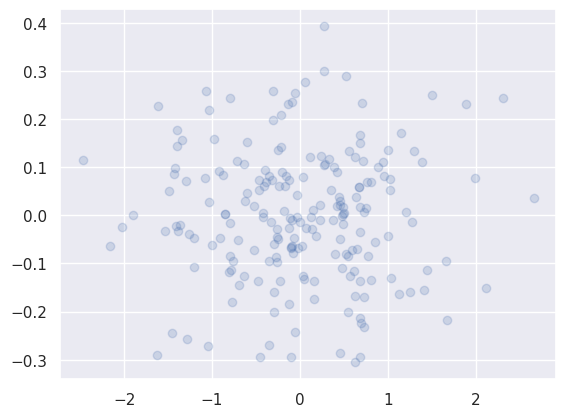

In [ ]:
Z = pca.transform(X)
plt.scatter(Z[:, 0], Z[:, 1], alpha=0.2)

### PCA as dimensionality reduction

Using PCA for dimensionality reduction involves zeroing out one or more of the smallest principal components, resulting in a lower-dimensional projection of the data that preserves the maximal data variance.

Here is an example of using PCA as a dimensionality reduction transform:

In [ ]:
pca = PCA(n_components=1) # Creamos el modelo PCA
pca.fit(X) # Entrenamos el modelo
X_pca = pca.transform(X) # Transformamos los datos al espacio latente
print("original shape:   ", X.shape)
print("transformed shape:", X_pca.shape)

original shape:    (200, 2)
transformed shape: (200, 1)


In order to transform back to the input space the latent dataset ${\bf{Z}}$, we need to care for:

- ${\bf{X}}\in \mathbb{R}^{N\times D}$
- ${\bf{W}}\in \mathbb{R}^{D\times q}$, where $q$ are the most relevant eignevalues of $\bf{S}$

- ${\bf{Z}} = {\bf{XW}} $
- $ {\bf{Z}}{\bf{W}}^{-1} = {\bf{XW}}{\bf{W}}^{-1} ={\bf{Z}}{\bf{W}}^{-1} = {\bf{X}}{\bf{I}}$
- $ {\bf{X}}_{reproy} = {\bf{Z}}{\bf{W}}^{-1}$

The transformed data has been reduced to a single dimension.
To understand the effect of this dimensionality reduction, we can perform the inverse transform of this reduced data and plot it along with the original data:

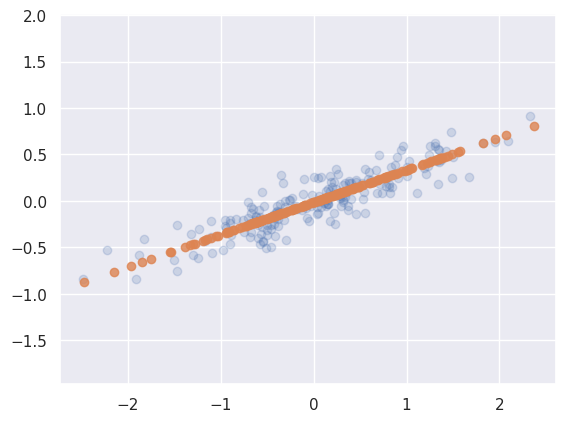

In [ ]:
X_new = pca.inverse_transform(X_pca)
plt.scatter(X[:, 0], X[:, 1], alpha=0.2)
plt.scatter(X_new[:, 0], X_new[:, 1], alpha=0.8)
plt.axis('equal');

The light points are the original data, while the dark points are the projected version.
This makes clear what a PCA dimensionality reduction means: the information along the least important principal axis or axes is removed, leaving only the component(s) of the data with the highest variance.
The fraction of variance that is cut out (proportional to the spread of points about the line formed in this figure) is roughly a measure of how much "information" is discarded in this reduction of dimensionality.

This reduced-dimension dataset is in some sense "good enough" to encode the most important relationships between the points: despite reducing the dimension of the data by 50%, the overall relationship between the data points are mostly preserved.

### PCA for visualization: Hand-written digits

The usefulness of the dimensionality reduction may not be entirely apparent in only two dimensions, but becomes much more clear when looking at high-dimensional data.
To see this, let's take a quick look at the application of PCA to the digits data:

We start by loading the data:

In [ ]:
from sklearn.datasets import load_digits
digits = load_digits()
N, D = digits.data.shape
print('# Observations: ', N,'\t# Features: ',D)

# Observations:  1797 	# Features:  64


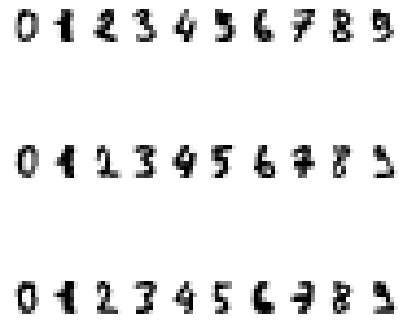

In [ ]:
#Display the first ten digits
fig, axs = plt.subplots(3,10, figsize=(5, 5), facecolor='w', edgecolor='k')
axs = axs.ravel()
for nDigit in range(30):
  digitImg = digits.images[nDigit]
  axs[nDigit].imshow(digitImg, cmap=plt.cm.gray_r, interpolation='nearest')
  axs[nDigit].axis('off')
plt.show()

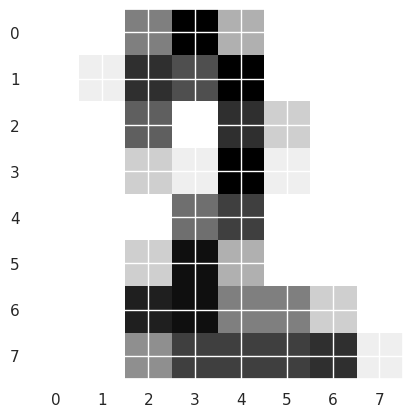

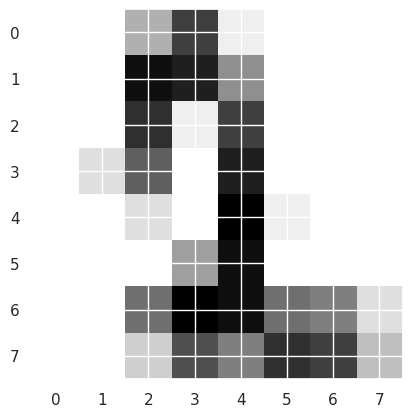

In [ ]:
plt.imshow(digits.images[20+2], cmap=plt.cm.gray_r)

plt.figure()
plt.imshow(digits.images[10+2], cmap=plt.cm.gray_r)

Recall that the data consists of 8×8 pixel images, meaning that they are 64-dimensional.
To gain some intuition into the relationships between these points, we can use PCA to project them to a more manageable number of dimensions, say two:

Input Space: (1797, 64)
Latent Space: (1797, 64)
[1.79006930e+02 1.63717747e+02 1.41788439e+02 1.01100375e+02
 6.95131656e+01 5.91085249e+01 5.18845391e+01 4.40151067e+01
 4.03109953e+01 3.70117984e+01 2.85190412e+01 2.73211698e+01
 2.19014881e+01 2.13243565e+01 1.76367222e+01 1.69468639e+01
 1.58513899e+01 1.50044602e+01 1.22344732e+01 1.08868593e+01
 1.06935663e+01 9.58259779e+00 9.22640260e+00 8.69036872e+00
 8.36561190e+00 7.16577961e+00 6.91973881e+00 6.19295508e+00
 5.88499123e+00 5.15586690e+00 4.49129656e+00 4.24687799e+00
 4.04743883e+00 3.94340334e+00 3.70647245e+00 3.53165306e+00
 3.08457409e+00 2.73780002e+00 2.67210896e+00 2.54170563e+00
 2.28298744e+00 1.90724229e+00 1.81716569e+00 1.68996439e+00
 1.40197220e+00 1.29221888e+00 1.15893419e+00 9.31220008e-01
 6.69850594e-01 4.86065217e-01 2.52350432e-01 9.91527944e-02
 6.31307848e-02 6.07377581e-02 3.96662297e-02 1.49505636e-02
 8.47307261e-03 3.62365957e-03 1.27705113e-03 6.61270906e-04
 4.12223305e-04 1.14286697e-30 1.142

Text(0.5, 1.0, 'Var explained normalized')

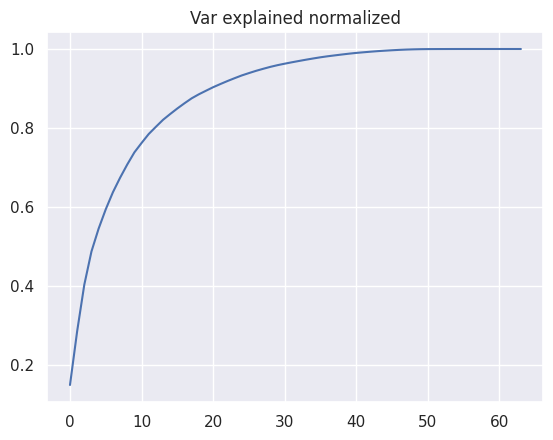

In [ ]:
pca = PCA(n_components = 64)  # project from 64 to 2 dimensions
X = digits.data # Load our dataset X
projectedZ = pca.fit_transform(X)
BasisW = pca.components_
print('Input Space:',digits.data.shape)
print('Latent Space:',projectedZ.shape)
print(pca.explained_variance_)
print(BasisW.shape)
plt.plot(np.cumsum(pca.explained_variance_)/np.sum(pca.explained_variance_))
plt.title('Var explained normalized')

We can now plot the first two principal components of each point to learn about the data:

<ipython-input-14-d9e4ba29bde7>:3: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap=plt.cm.get_cmap('tab10', 10))


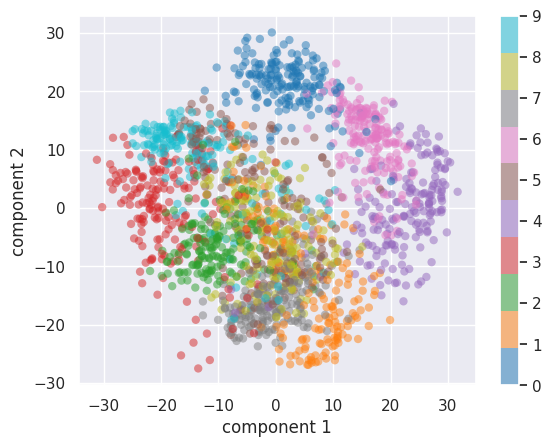

In [ ]:
plt.scatter(projectedZ[:, 0], projectedZ[:, 1],
             c=digits.target, edgecolor='none', alpha=0.5,
            cmap=plt.cm.get_cmap('tab10', 10))
plt.xlabel('component 1')
plt.ylabel('component 2')
plt.colorbar();

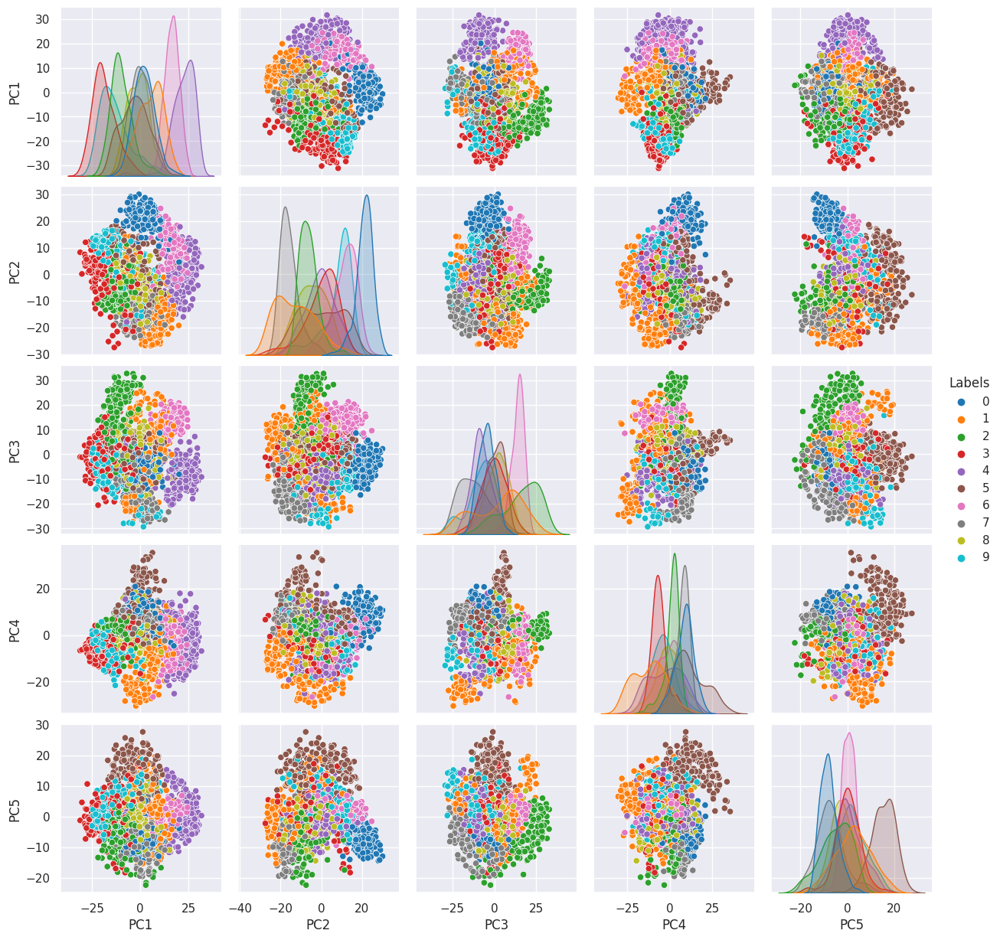

In [ ]:
# Misma versión con Pandas
import pandas as pd
import seaborn as sns
X_prueba = projectedZ[:,:5]
y = digits.target

dataFrame = pd.DataFrame(X_prueba,columns=['PC1','PC2','PC3','PC4','PC5'])
dataFrame['Labels'] = y

sns.pairplot(dataFrame, hue='Labels', palette='tab10')



Recall what these components mean: the full data is a 64-dimensional point cloud, and these points are the projection of each data point along the directions with the largest variance.
Essentially, we have found the optimal stretch and rotation in 64-dimensional space that allows us to see the layout of the digits in two dimensions, and have done this in an unsupervised manner—that is, without reference to the labels.

### What do the components mean?

We can go a bit further here, and begin to ask what the reduced dimensions *mean*.
This meaning can be understood in terms of combinations of basis vectors.
For example, each image in the training set is defined by a collection of 64 pixel values, which we will call the vector $x$:

$$
x = [x_1, x_2, x_3 \cdots x_{64}]
$$

One way we can think about this is in terms of a pixel basis.
That is, to construct the image, we multiply each element of the vector by the pixel it describes, and then add the results together to build the image:

$$
{\rm image}(x) = x_1 \cdot{\rm (pixel~1)} + x_2 \cdot{\rm (pixel~2)} + x_3 \cdot{\rm (pixel~3)} \cdots x_{64} \cdot{\rm (pixel~64)}
$$

One way we might imagine reducing the dimension of this data is to zero out all but a few of these basis vectors.
For example, if we use only the first eight pixels, we get an eight-dimensional projection of the data, but it is not very reflective of the whole image: we've thrown out nearly 90% of the pixels!

![](https://github.com/jakevdp/PythonDataScienceHandbook/blob/master/notebooks/figures/05.09-digits-pixel-components.png?raw=1)


The upper row of panels shows the individual pixels, and the lower row shows the cumulative contribution of these pixels to the construction of the image.
Using only eight of the pixel-basis components, we can only construct a small portion of the 64-pixel image.
Were we to continue this sequence and use all 64 pixels, we would recover the original image.

But the pixel-wise representation is not the only choice of basis. We can also use other basis functions, which each contain some pre-defined contribution from each pixel, and write something like

$$
image(x) = {\rm mean} + x_1 \cdot{\rm (basis~1)} + x_2 \cdot{\rm (basis~2)} + x_3 \cdot{\rm (basis~3)} \cdots
$$

PCA can be thought of as a process of choosing optimal basis functions, such that adding together just the first few of them is enough to suitably reconstruct the bulk of the elements in the dataset.
The principal components, which act as the low-dimensional representation of our data, are simply the coefficients that multiply each of the elements in this series.
This figure shows a similar depiction of reconstructing this digit using the mean plus the first eight PCA basis functions:

![](https://github.com/jakevdp/PythonDataScienceHandbook/blob/master/notebooks/figures/05.09-digits-pca-components.png?raw=1)


Unlike the pixel basis, the PCA basis allows us to recover the salient features of the input image with just a mean plus eight components!
The amount of each pixel in each component is the corollary of the orientation of the vector in our two-dimensional example.
This is the sense in which PCA provides a low-dimensional representation of the data: it discovers a set of basis functions that are more efficient than the native pixel-basis of the input data.

In [ ]:
from ipywidgets import interact

In [ ]:
@interact(Q = (2,64),NumIm = (1,1500),LatentId = (1,64))
def PCA_Rec(Q, NumIm,LatentId):
  # Reconstruction from the Latent Space
  pca = PCA(n_components = Q)  # project from 64 to 2 dimensions
  # Load our dataset X
  X = digits.data
  # Enviamos al latent space (input to latent)
  projectedZ = pca.fit_transform(X)
  Basis = pca.components_
  print(Basis.shape)
  print(digits.data.shape)
  print(projectedZ.shape)
  print(Basis.shape)
  # Projected back to the original space (from latent to input)
  reconstructedX = pca.inverse_transform(projectedZ)

  #Display the first ten digits
  # We select the test digits
  idTest = NumIm
  print('Digit: ',digits.target[idTest])
  digitOrg = X[idTest,:].reshape(8,8)
  digitRec = reconstructedX[idTest,:].reshape(8,8)
  digit_Z = Basis[LatentId,:].reshape(8,8)
  fig, axs = plt.subplots(1,3, figsize=(10, 10), facecolor='w', edgecolor='k')
  axs = axs.ravel()
  axs[0].imshow(digitOrg, cmap=plt.cm.gray_r, interpolation='nearest')
  axs[0].title.set_text('Input Data: x')
  axs[0].axis('off')
  axs[1].title.set_text('Reconstructed Data from: z')
  axs[1].imshow(digitRec, cmap=plt.cm.gray_r, interpolation='nearest')
  axs[1].axis('off')
  axs[2].title.set_text('Latent Representation: Q_th component')
  axs[2].imshow(digit_Z, cmap=plt.cm.gray_r, interpolation='nearest')
  axs[2].axis('off')
  plt.show()
  plt.figure()
  plt.plot(np.cumsum(pca.explained_variance_)/np.sum(pca.explained_variance_))
  plt.show()

interactive(children=(IntSlider(value=33, description='Q', max=64, min=2), IntSlider(value=750, description='N…

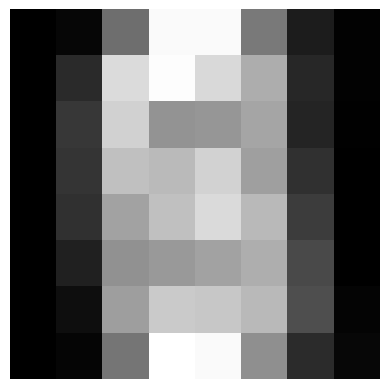

In [ ]:
meanX = np.mean(X,axis=0)

imgMeanX = meanX.reshape(8,8)

plt.imshow(imgMeanX,cmap='gray')
plt.axis('off')
plt.show()

### Choosing the number of components

A vital part of using PCA in practice is the ability to estimate how many components are needed to describe the data.
This can be determined by looking at the cumulative *explained variance ratio* as a function of the number of components:

(64,) 
 Explained variance 0.9590854042457171


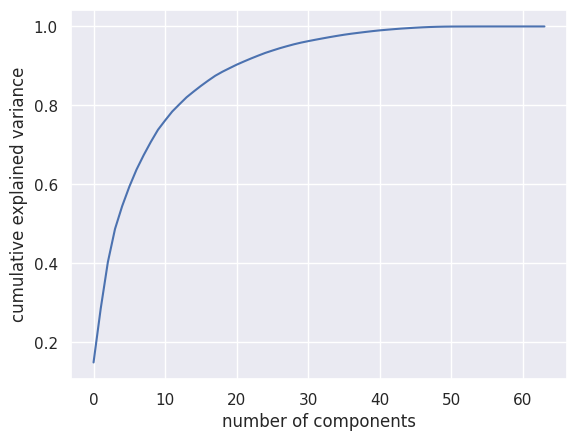

In [ ]:
X =digits.data
pca = PCA().fit(X)
varExp = pca.explained_variance_ratio_
print(varExp.shape,'\n Explained variance',np.sum(varExp[:30]))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance');

This curve quantifies how much of the total, 64-dimensional variance is contained within the first $N$ components.
For example, we see that with the digits the first 10 components contain approximately 75% of the variance, while you need around 50 components to describe close to 100% of the variance.

Here we see that our two-dimensional projection loses a lot of information (as measured by the explained variance) and that we'd need about 20 components to retain 90% of the variance.  Looking at this plot for a high-dimensional dataset can help you understand the level of redundancy present in multiple observations.

## PCA as Noise Filtering

PCA can also be used as a filtering approach for noisy data.
The idea is this: any components with variance much larger than the effect of the noise should be relatively unaffected by the noise.
So if you reconstruct the data using just the largest subset of principal components, you should be preferentially keeping the signal and throwing out the noise.

Let's see how this looks with the digits data.
First we will plot several of the input noise-free data:

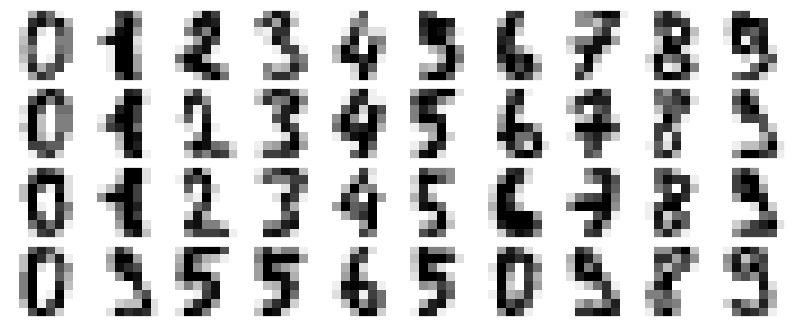

In [ ]:
def plot_digits(data):
    fig, axes = plt.subplots(4, 10, figsize=(10, 4),
                             subplot_kw={'xticks':[], 'yticks':[]},
                             gridspec_kw=dict(hspace=0.1, wspace=0.1))
    for i, ax in enumerate(axes.flat):
        ax.imshow(data[i].reshape(8, 8),
                  cmap='binary', interpolation='nearest',
                  clim=(0, 16))
plot_digits(digits.data)

Now lets add some random noise to create a noisy dataset, and re-plot it:

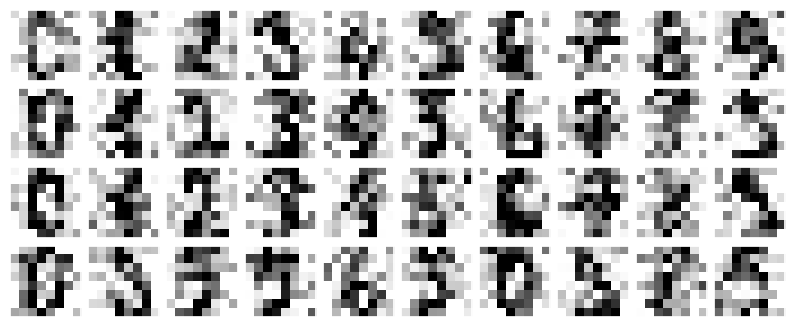

In [ ]:
np.random.seed(42)
noisy = np.random.normal(digits.data, 5)
plot_digits(noisy)

It's clear by eye that the images are noisy, and contain spurious pixels.
Let's train a PCA on the noisy data, requesting that the projection preserve 50% of the variance:

In [ ]:
# Si le enviamos un flotante entre [0-1], retornará las componentes que retienen
# esa cantidad de varianza
pca = PCA(0.4).fit(noisy)
pca.n_components_

10

Here 50% of the variance amounts to 6-12 principal components.
Now we compute these components, and then use the inverse of the transform to reconstruct the filtered digits:

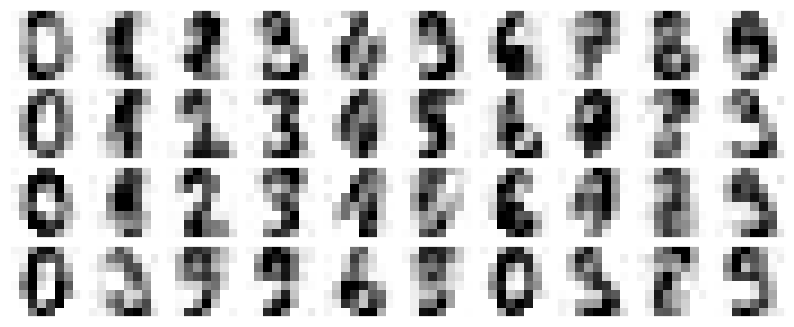

In [ ]:
components = pca.transform(noisy)
filtered = pca.inverse_transform(components)
plot_digits(filtered)

This signal preserving/noise filtering property makes PCA a very useful feature selection routine—for example, rather than training a classifier on very high-dimensional data, you might instead train the classifier on the lower-dimensional representation, which will automatically serve to filter out random noise in the inputs.

## Example: Eigenfaces

Recall:

- Our dataset ${\bf{X}}\in \mathbb{R}^{N\times D}$, where $N$ is the number of observations, and $D$ are the number of features of the dataset.
- Our task is to compute the Eigendecomposition (Eigenvectors and eingenvalues) of $cov[{\bf{X}}]$


We will explore here an example of using a PCA projection as a feature selector for facial recognition (That we'll continue next in **classification models**).
Here we will take a look back and explore a bit more of what went into that.
Recall that we were using the Labeled Faces in the Wild dataset made available through Scikit-Learn:

In [ ]:
from sklearn.datasets import fetch_lfw_people
faces = fetch_lfw_people(min_faces_per_person=30)
print(faces.target_names)
print(faces.images.shape)
print(faces.data.shape)

['Alejandro Toledo' 'Alvaro Uribe' 'Andre Agassi' 'Ariel Sharon'
 'Arnold Schwarzenegger' 'Colin Powell' 'David Beckham' 'Donald Rumsfeld'
 'George W Bush' 'Gerhard Schroeder' 'Gloria Macapagal Arroyo'
 'Guillermo Coria' 'Hans Blix' 'Hugo Chavez' 'Jacques Chirac'
 'Jean Chretien' 'Jennifer Capriati' 'John Ashcroft' 'John Negroponte'
 'Junichiro Koizumi' 'Kofi Annan' 'Laura Bush' 'Lleyton Hewitt'
 'Luiz Inacio Lula da Silva' 'Megawati Sukarnoputri' 'Nestor Kirchner'
 'Recep Tayyip Erdogan' 'Roh Moo-hyun' 'Serena Williams'
 'Silvio Berlusconi' 'Tom Ridge' 'Tony Blair' 'Vicente Fox'
 'Vladimir Putin']
(2370, 62, 47)
(2370, 2914)


In [ ]:
type(faces)

sklearn.utils._bunch.Bunch

In [ ]:
dataFrame.values[:,0:-1]

array([[ -1.25946645,  21.27488348,  -9.46305462,  13.01418869,
         -7.12882278],
       [  7.9576113 , -20.76869896,   4.43950604, -14.89366444,
          5.89624878],
       [  6.99192297,  -9.95598641,   2.95855808, -12.28830243,
        -18.1260233 ],
       ...,
       [ 10.8012837 ,  -6.96025223,   5.59955453,  -7.22773348,
         -3.45964589],
       [ -4.87210009,  12.42395362, -10.17086635,  -6.66885049,
          3.56906108],
       [ -0.34438963,   6.36554919,  10.77370849,  -7.72621321,
         -3.31061536]])

In [ ]:
from sklearn.decomposition import PCA

Let's take a look at the principal axes that span this dataset.
Because this is a large dataset, we will use ``RandomizedPCA``—it contains a randomized method to approximate the first $N$ principal components much more quickly than the standard ``PCA`` estimator, and thus is very useful for high-dimensional data (here, a dimensionality of nearly 3,000).
We will take a look at the first 150 components:

In [ ]:
pca = PCA(n_components = 150, svd_solver='randomized')
pca.fit(faces.data)

PCA(n_components=150, svd_solver='randomized')

In this case, it can be interesting to visualize the images associated with the first several principal components (these components are technically known as "eigenvectors,"
so these types of images are often called "eigenfaces").
As you can see in this figure, they are as creepy as they sound:

In [ ]:
Wprojection = pca.components_
q, D = Wprojection.shape
print('Latent dim q= ',q)
print('Input dim D= ',D)
PC1 = Wprojection[0]

Latent dim q=  150
Input dim D=  2914


PCA perform a given linear mapping trhough

$\bf{z} = \bf{W}\bf{x}$

In [ ]:
z_test = Wprojection.dot(faces.data[0,:])

Una nueva instancia se puede obtener del espacio latente

$x_{new} = \bf{z}\bf{W}^{-1} + {\bf{\mu}}$

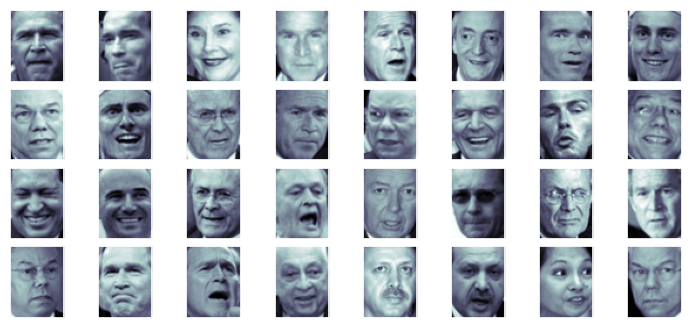

In [ ]:
# Lets visualize the original faces
fig, axes = plt.subplots(4, 8, figsize=(9, 4),
                         subplot_kw={'xticks':[], 'yticks':[]},
                         gridspec_kw=dict(hspace=0.1, wspace=0.1))
for i, ax in enumerate(axes.flat):
    ax.imshow(faces.data[0+i].reshape(62, 47), cmap='bone')

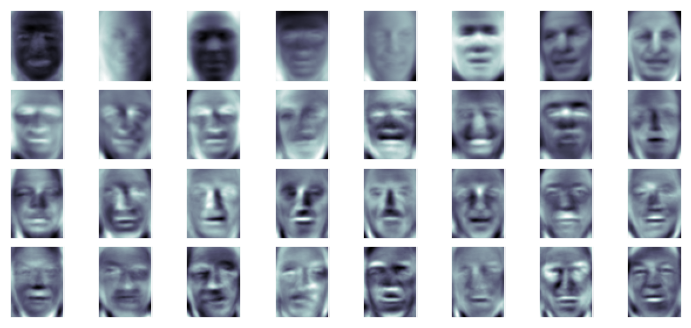

In [ ]:
fig, axes = plt.subplots(4, 8, figsize=(9, 4),
                         subplot_kw={'xticks':[], 'yticks':[]},
                         gridspec_kw=dict(hspace=0.1, wspace=0.1))
for i, ax in enumerate(axes.flat):
    ax.imshow(pca.components_[0+i].reshape(62, 47), cmap='bone')

The results are very interesting, and give us insight into how the images vary: for example, the first few eigenfaces (from the top left) seem to be associated with the angle of lighting on the face, and later principal vectors seem to be picking out certain features, such as eyes, noses, and lips.
Let's take a look at the cumulative variance of these components to see how much of the data information the projection is preserving:

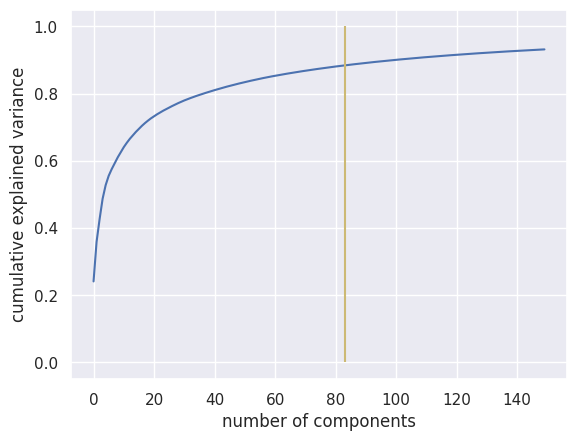

In [ ]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.vlines(83,0.,1.,colors='y')
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance');

In [ ]:
varAcum = np.cumsum(pca.explained_variance_ratio_)

aux = np.where(varAcum>=0.9)
print(varAcum)
print(aux)

[0.24114062 0.3588037  0.42655188 0.48735213 0.5276346  0.5553786
 0.5754077  0.59334    0.61053604 0.6258784  0.64090073 0.6538606
 0.6657012  0.67610747 0.6862649  0.6955133  0.70436627 0.7124493
 0.7198223  0.72668296 0.7326872  0.7385769  0.74397516 0.7491746
 0.75397265 0.7587032  0.76324326 0.7676579  0.7719256  0.77598697
 0.7798182  0.78342533 0.78677857 0.7900876  0.79324853 0.7962849
 0.79924625 0.8021526  0.8050156  0.80779386 0.81048    0.81312865
 0.8157409  0.8182898  0.82073826 0.8231205  0.82547706 0.8277855
 0.83000714 0.8321788  0.8343361  0.8364419  0.8384952  0.8404847
 0.8424405  0.84436804 0.846246   0.8480936  0.84984505 0.8515523
 0.85320336 0.8548497  0.8564694  0.85803026 0.85956216 0.8610712
 0.8625554  0.86400884 0.8654314  0.86684954 0.8682367  0.8695887
 0.8709065  0.87221    0.8734896  0.87475973 0.87601066 0.8772345
 0.87844396 0.8796321  0.88078856 0.88192767 0.88304883 0.88415545
 0.8852401  0.88631564 0.8873757  0.8884141  0.8894429  0.8904652
 0.8914

We see that these 150 components account for just over 90% of the variance.
That would lead us to believe that using these 150 components, we would recover most of the essential characteristics of the data.
To make this more concrete, we can compare the input images with the images reconstructed from these 150 components:

In [ ]:
# Compute the components and projected faces
pca = PCA(n_components = 150,svd_solver='randomized').fit(faces.data)
Xfaces = faces.data
components = pca.transform(faces.data)
projected = pca.inverse_transform(components)

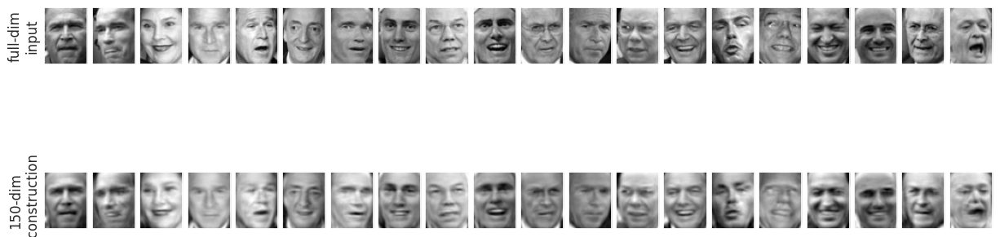

In [ ]:
# Plot the results
fig, ax = plt.subplots(2, 20, figsize=(15,5),
                       subplot_kw={'xticks':[], 'yticks':[]},
                       gridspec_kw=dict(hspace=0.1, wspace=0.1))
for i in range(20):
    ax[0, i].imshow(faces.data[i].reshape(62, 47), cmap='binary_r')
    ax[1, i].imshow(projected[i].reshape(62, 47), cmap='binary_r')

ax[0, 0].set_ylabel('full-dim\ninput')
ax[1, 0].set_ylabel('150-dim\nreconstruction');

The top row here shows the input images, while the bottom row shows the reconstruction of the images from just 150 of the ~3,000 initial features.
This visualization makes clear why the PCA feature selection used in face recognition systems was so successful: although it reduces the dimensionality of the data by nearly a factor of 20, the projected images contain enough information that we might, by eye, recognize the individuals in the image.
What this means is that our classification algorithm needs to be trained on 150-dimensional data rather than 3,000-dimensional data, which depending on the particular algorithm we choose, can lead to a much more efficient classification.

## Principal Component Analysis Summary

In this tutorial we have discussed the use of principal component analysis for dimensionality reduction, for visualization of high-dimensional data, for noise filtering, and for feature selection within high-dimensional data.
Because of the versatility and interpretability of PCA, it has been shown to be effective in a wide variety of contexts and disciplines.
Given any high-dimensional dataset, I tend to start with PCA in order to visualize the relationship between points (as we did with the digits), to understand the main variance in the data (as we did with the eigenfaces), and to understand the intrinsic dimensionality (by plotting the explained variance ratio).
Certainly PCA is not useful for every high-dimensional dataset, but it offers a straightforward and efficient path to gaining insight into high-dimensional data.

PCA's main weakness is that it tends to be highly affected by outliers in the data.
For this reason, many robust variants of PCA have been developed, many of which act to iteratively discard data points that are poorly described by the initial components.
Scikit-Learn contains a couple interesting variants on PCA, including ``RandomizedPCA`` and ``SparsePCA``, both also in the ``sklearn.decomposition`` submodule.
``RandomizedPCA``, which we saw earlier, uses a non-deterministic method to quickly approximate the first few principal components in very high-dimensional data, while ``SparsePCA`` introduces a regularization term (see https://en.wikipedia.org/wiki/Sparse_PCA) that serves to enforce sparsity of the components.



$\bf{z}$ dimensión $q\times 1 $

$\bf{W}$

Have Fun!!!!

Prof. Hernán Felipe García

Thanks to [Python Data Science Handbook](http://shop.oreilly.com/product/0636920034919.do) by Jake VanderPlas

---
## **Trabajo de laboratorio:**

Vamos a utilizar PCA sobre las características extraídas en el **Miniproyecto 1**. Específicamente analizaremos los siguientes casos:

1. **Número de componentes = 2:**

  Graficar las características proyectadas a un espacio de dos componentes principales. Utilice un color diferente para cada estado emocional (calmado, neutral, excitado). ¿Qué beneficio tiene expresar los datos en este espacio de dimensión reducida?, argumente su respuesta.

2. **Número de componentes = 5:**

  Utilice pair plots para graficar las características proyectadas al espacio de componentes principales de dimensión 5. ¿Para qué pares de componentes se generan grupos o clusters distintivos para cada uno de los tres estados emocionales  (calmado, neutral, excitado)?. Analice y discuta los resultados.

3. **Número de componentes = número de características:**
  
  Haga un análisis de varianza y determine cuántos componentes son necesarios para preservar el 90% de la varianza presente en los datos. ¿En qué porcentaje se redujo la dimensionalidad?, ¿qué beneficios tiene esta reducción?. Argumente.

---

https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.to_pickle.html
DataFrame.to_pickle(path, compression='infer', protocol=5, storage_options=None)

Inicialmente se procede a realizar la extracción de características del MIno Proyecto

La Base de Datos DEAP representa un recurso multimodal diseñado para el análisis de los estados emocionales en seres humanos. En este proyecto, se capturaron datos de 32 participantes, incluyendo registros de electroencefalograma (EEG) y señales fisiológicas periféricas, mientras cada uno de ellos visualizaba 40 extractos de videos musicales con una duración de un minuto cada uno. Los participantes evaluaron cada video en términos de excitación (arousal), valencia, preferencia, dominio y familiaridad. Además, en el caso de 22 de los 32 participantes, se grabó un video frontal.

In [ ]:
# Importar librerías

import scipy.signal

import numpy as np
import pandas as pd
import seaborn as sns
import scipy.io as sc
import matplotlib.pyplot as plt

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [ ]:
# Descarga de los sets de datos

#https://drive.google.com/file/d/1A7h9ir9gatSn4WNWr2JQUPCKGOai-ZKb/view?usp=sharing
!gdown '1A7h9ir9gatSn4WNWr2JQUPCKGOai-ZKb'

#https://drive.google.com/file/d/1-1_CXdtbZDMxo4x7lDM4w3Ecqu-6PAa8/view?usp=sharing
!gdown '1-1_CXdtbZDMxo4x7lDM4w3Ecqu-6PAa8'

#https://drive.google.com/file/d/12ffKvlfh4JQqXDxVISiPHoGM88nEokcS/view?usp=sharing
!gdown '12ffKvlfh4JQqXDxVISiPHoGM88nEokcS'

#https://drive.google.com/file/d/1jFQPbGLw3N9HwxLaJt8EEC5EuAR66TVJ/view?usp=sharing
!gdown '1jFQPbGLw3N9HwxLaJt8EEC5EuAR66TVJ'

Downloading...
From: https://drive.google.com/uc?id=1A7h9ir9gatSn4WNWr2JQUPCKGOai-ZKb
To: /content/s14.mat
100% 80.6M/80.6M [00:00<00:00, 152MB/s]
Downloading...
From: https://drive.google.com/uc?id=1-1_CXdtbZDMxo4x7lDM4w3Ecqu-6PAa8
To: /content/s17.mat
100% 80.7M/80.7M [00:00<00:00, 153MB/s]
Downloading...
From: https://drive.google.com/uc?id=12ffKvlfh4JQqXDxVISiPHoGM88nEokcS
To: /content/s16.mat
100% 80.8M/80.8M [00:01<00:00, 47.0MB/s]
Downloading...
From: https://drive.google.com/uc?id=1jFQPbGLw3N9HwxLaJt8EEC5EuAR66TVJ
To: /content/s15.mat
100% 80.7M/80.7M [00:00<00:00, 81.4MB/s]


In [ ]:
# Carga de datos desde archivos .mat y almacenarlos en la variable 'datosPX'

datosP1 = sc.loadmat('s14.mat')
datosP2 = sc.loadmat('s15.mat')
datosP3 = sc.loadmat('s16.mat')
datosP4 = sc.loadmat('s17.mat')


In [ ]:
# Obtener los datos de señales y etiquetas de cada señal de datos datosPX

signals1   = datosP1['data']
etiquetas1 = datosP1['labels']
# Esto me arrojará un nd array de n_video * id_signal * Ntimepoints

signals2   = datosP2['data']
etiquetas2 = datosP2['labels']
# Esto me arrojará un nd array de n_video * id_signal * Ntimepoints

signals3   = datosP3['data']
etiquetas3 = datosP3['labels']
# Esto me arrojará un nd array de n_video * id_signal * Ntimepoints

signals4   = datosP4['data']
etiquetas4 = datosP4['labels']
# Esto me arrojará un nd array de n_video * id_signal * Ntimepoints

In [ ]:
# Imprimir las dimensiones de la matriz signalsX, que es de la forma (n_video, id_signal, Ntimepoints)
print(signals1.shape)
print(signals2.shape)
print(signals3.shape)
print(signals4.shape)

(40, 40, 6528)
(40, 40, 6528)
(40, 40, 6528)
(40, 40, 6528)


In [ ]:
fs = 128 # En la descripción de los datos se informa que la frecuencia de muestreo es de 128 Hz

In [ ]:
# Función para graficar las 40 señales en subplots de 8x5
def graficar_señales(canal, fuente):
    canal = canal - 1  # Restamos 1 al canal ya que la primera ubicación es igual a 0

    fig, axs = plt.subplots(8, 5, figsize=(15, 20))  # Crear una figura con subplots de 8 filas y 5 columnas

    for video in range(40):  # Ciclo que recorre todos los videos
        fila = video // 5  # Calcular la fila del subplot
        columna = video % 5  # Calcular la columna del subplot

        señal = fuente[video, canal, :]  # Variable de la señal escogida
        ts = len(señal) / 128.  # Tiempo de muestreo
        tiempo = np.linspace(0, ts, len(señal))  # Tiempo

        axs[fila, columna].plot(tiempo, señal)
        axs[fila, columna].set_title('Video ' + str(video + 1) + ' Canal ' + str(canal + 1))
        axs[fila, columna].set_ylabel('uV')
        axs[fila, columna].set_xlabel('s')
        axs[fila, columna].axis('on')
        axs[fila, columna].grid()

    plt.tight_layout()  # Ajustar el diseño de los subplots
    plt.show()

In [ ]:
# Función para graficar dos canales en subplots de 8x5
def graficar_señales2(canal1, canal2, label1, label2, fuente):
    canal1 = canal1 - 1  # Restamos 1 al canal1 ya que la primera ubicación es igual a 0
    canal2 = canal2 - 1  # Restamos 1 al canal2 ya que la primera ubicación es igual a 0

    fig, axs = plt.subplots(8, 5, figsize=(15, 20))  # Crear una figura con subplots de 8 filas y 5 columnas

    for video in range(40):  # Ciclo que recorre todos los videos
        fila = video // 5  # Calcular la fila del subplot
        columna = video % 5  # Calcular la columna del subplot

        señal_canal1 = fuente[video, canal1, :]  # Señal del canal 1
        señal_canal2 = fuente[video, canal2, :]  # Señal del canal 2
        ts = len(señal_canal1) / 128.  # Tiempo de muestreo
        tiempo = np.linspace(0, ts, len(señal_canal1))  # Tiempo

        axs[fila, columna].plot(tiempo, señal_canal1, label=label1)
        axs[fila, columna].plot(tiempo, señal_canal2, label=label2)
        axs[fila, columna].set_title('Video ' + str(video + 1))
        axs[fila, columna].set_ylabel('uV')
        axs[fila, columna].set_xlabel('s')
        axs[fila, columna].grid()
        axs[fila, columna].axis('on')
        axs[fila, columna].legend()

    plt.tight_layout()  # Ajustar el diseño de los subplots
    plt.show()

In [ ]:
# Canales de tipos de señales
canal_hEOG = 33
canal_vEOG = 34
canal_zEMG = 35
canal_tEMG = 36
canal_GSR = 37
canal_respiracion = 38
canal_plethysmograph = 39
canal_temperatura = 40

## **Graficamos para el sujeto 14**

### **EOG**

El electrooculograma (EOG) es un procedimiento médico en el que se colocan pequeños electrodos cerca de los músculos oculares para registrar y medir sus movimientos. Este examen se utiliza comúnmente en la polisomnografía, un estudio del sueño.

En condiciones normales, se observa una diferencia de potencial eléctrico de aproximadamente 0.4 a 5 milivoltios (mV) entre la córnea del ojo y una membrana llamada membrana de Bruch, que se encuentra en la parte posterior del ojo.

La raíz de esta diferencia de potencial se localiza en el epitelio pigmentario de la retina, y esto nos permite considerar la existencia de un dipolo eléctrico. Este dipolo puede representarse mediante un vector, cuyo extremo positivo coincide con la córnea y el extremo negativo con la retina, y su brazo se alinea con el eje anteroposterior del globo ocular.

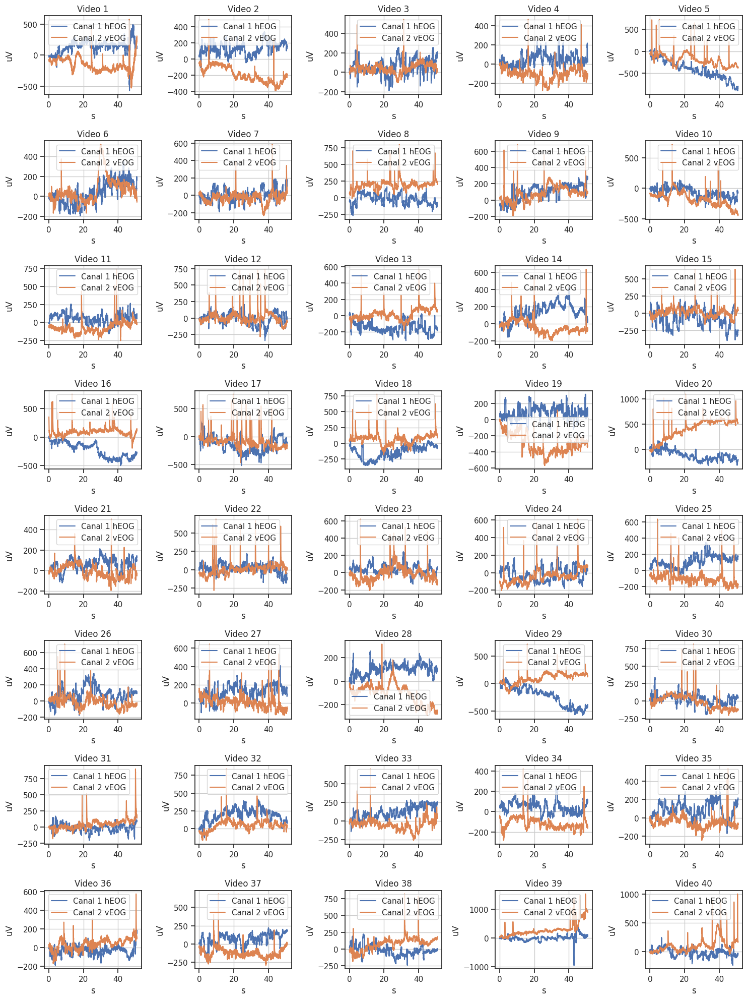

In [ ]:
# Llama a la función para graficar los diferentes canales
graficar_señales2(canal_hEOG, canal_vEOG, 'Canal 1 hEOG', 'Canal 2 vEOG', signals1)

### **EMG**

Las señales electromiográficas (EMG) son señales eléctricas generadas por un músculo cuando se contrae o se relaja. Esta propiedad muscular se busca aprovechar en la computación para desarrollar interfaces de comunicación entre el usuario y la máquina, ofreciendo alternativas a los dispositivos convencionales como el teclado y el ratón.

La señal EMG tiene dos canales, 35 y 36.

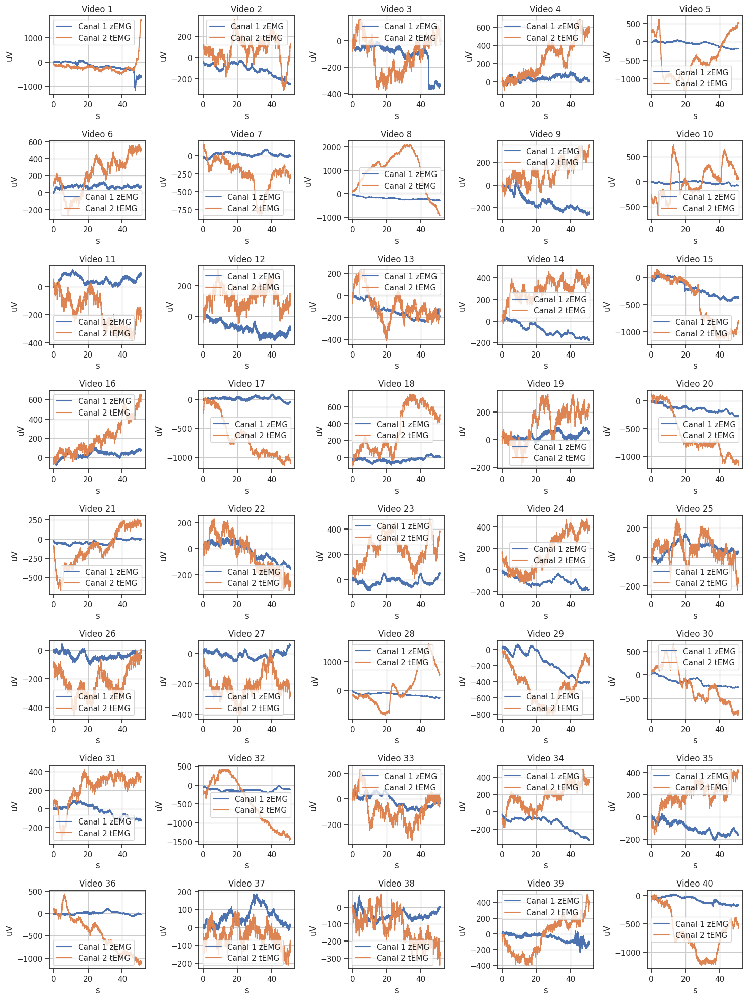

In [ ]:
# Llama a la función para graficar los diferentes canales
graficar_señales2(canal_zEMG, canal_tEMG, 'Canal 1 zEMG', 'Canal 2 tEMG', signals1)

### **GSR**

La respuesta galvánica de la piel (GSR), también conocida como actividad electrodérmica (EDA) y conductancia de la piel (SC), implica la medición de los cambios constantes en las propiedades eléctricas de la piel, como la conductancia, que se producen como resultado de las fluctuaciones en la sudoración del cuerpo humano.

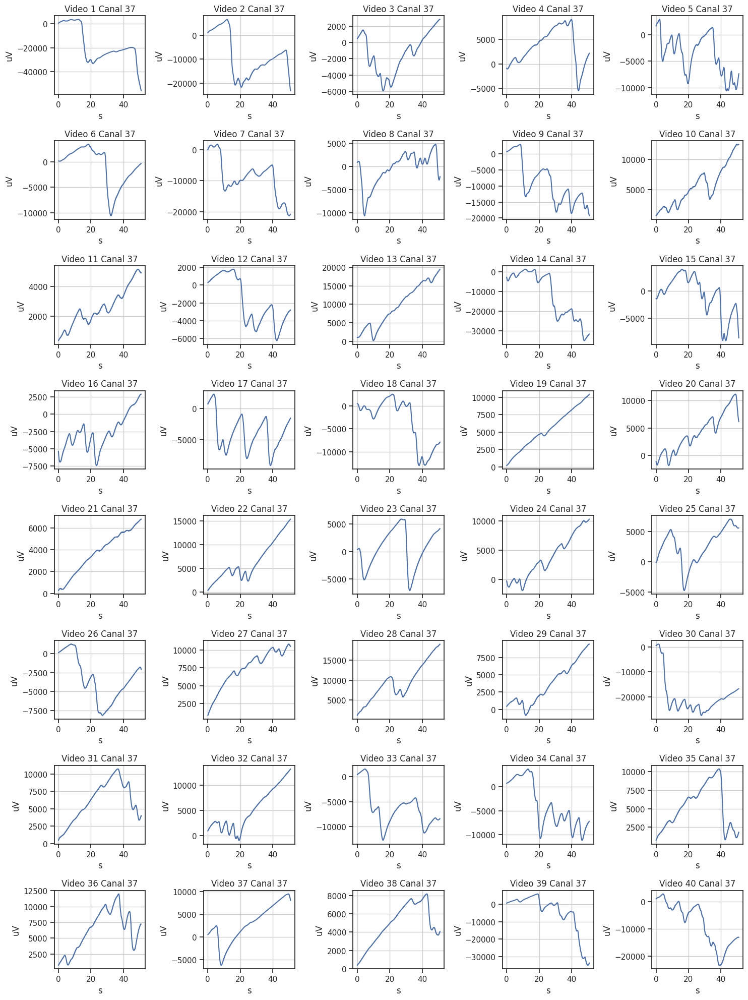

In [ ]:
# Llama a la función para graficar los diferentes canales
graficar_señales(canal_GSR, signals1)

### **RESPIRATION PATTERN**

Los patrones de respiración hacen referencia a la frecuencia respiratoria, que se describe como la cantidad de respiraciones que ocurren en un intervalo de tiempo determinado, además de considerar la cantidad de aire que se inhala y exhala en cada ciclo respiratorio (volumen tidal). Estos patrones de respiración desempeñan un papel fundamental en el diagnóstico de diversas enfermedades, algunas de las cuales no se limitan únicamente al sistema respiratorio, ya que afectan otros sistemas del cuerpo.

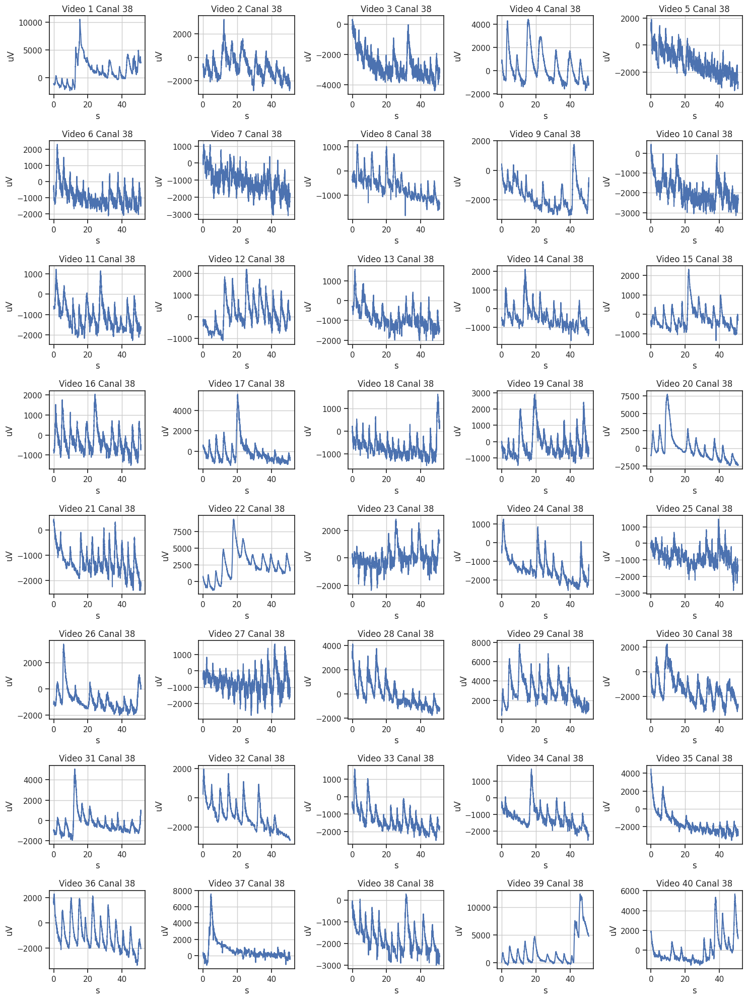

In [ ]:
# Llama a la función para graficar los diferentes canales
graficar_señales(canal_respiracion, signals1)

### **BLOOD VOLUME PRESSURE**

La pletismografía comprende métodos que registran modificaciones en el volumen debido a alteraciones en el flujo sanguíneo. Estos métodos no se enfocan exclusivamente en un vaso arterial particular, sino que detectan cambios de volumen en un tramo de la extremidad.

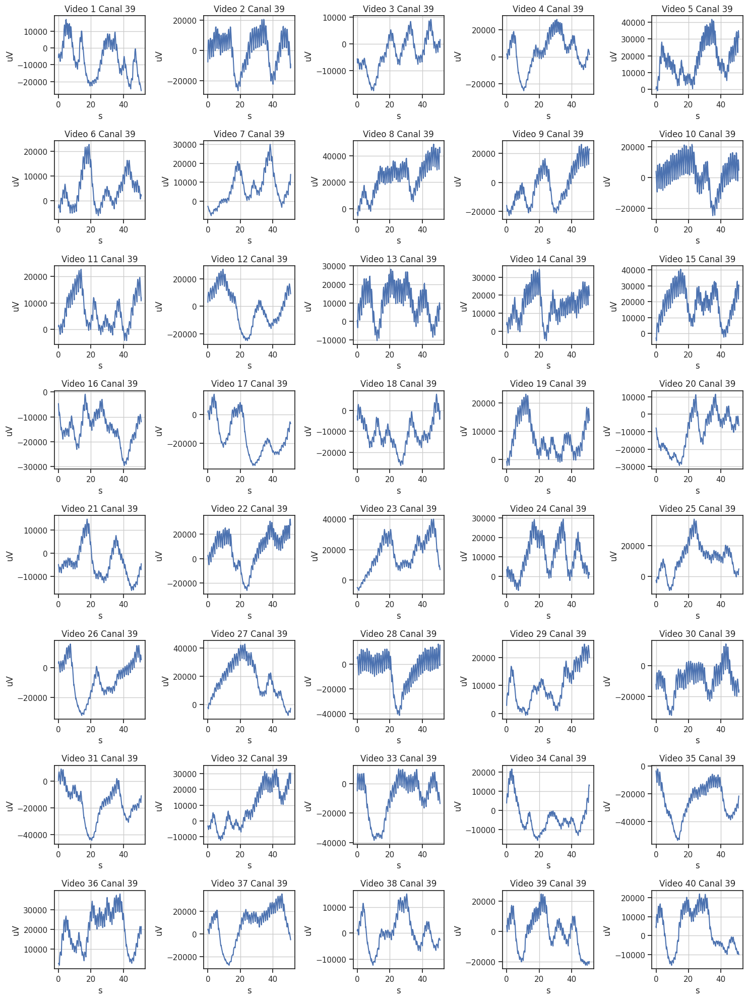

In [ ]:
# Llama a la función para graficar los diferentes canales
graficar_señales(canal_plethysmograph, signals1)

### **SKIN TEMPERATURE**

Las emociones orquestan nuestras acciones y respuestas fisiológicas en situaciones significativas para la supervivencia y experiencias gratificantes. Aunque en muchas ocasiones somos conscientes de nuestras emociones presentes, como la ira o la felicidad, los procesos subyacentes que generan estas sensaciones subjetivas aún se mantienen en gran parte sin resolver.

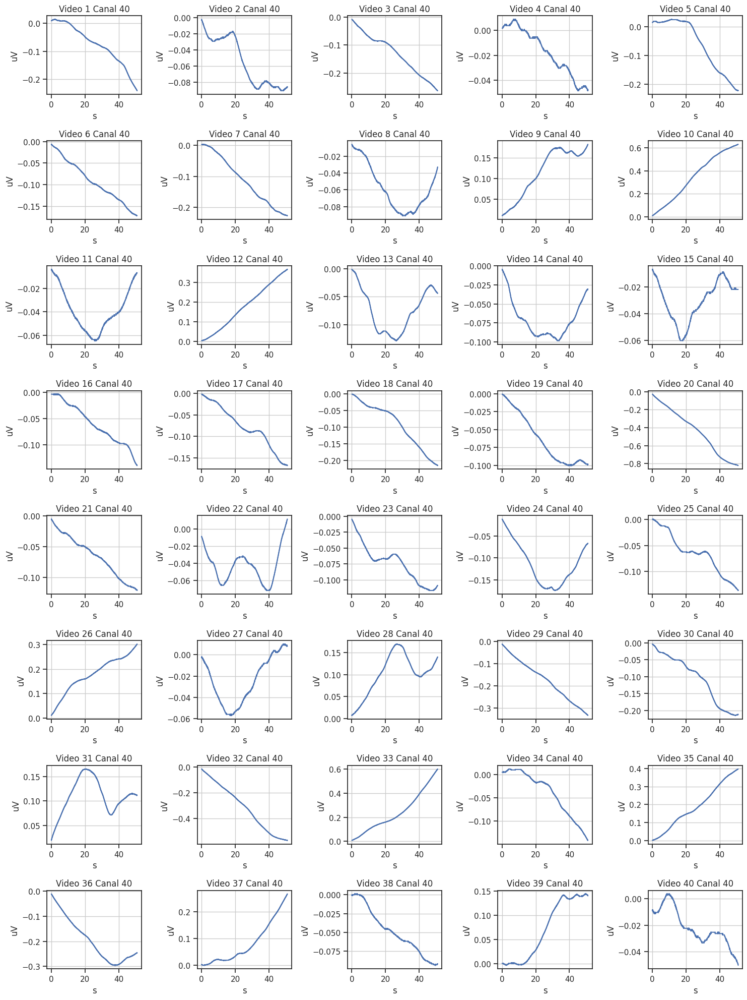

In [ ]:
# Llama a la función para graficar los diferentes canales
graficar_señales(canal_temperatura, signals1)

Cada Conjunto de características procesado será un vector de ${\bf{x}}\in\mathbb{R}^{D\times 1}$

Se construirá una matriz de características ${\bf{X}}\in\mathbb{R}^{N\times D}$ donde ${\bf{X}} = \{{\bf{x}}_n\}_{n=1}^{N}$

La siguiente tabla muestra el diseño de canales y el preprocesamiento realizado:

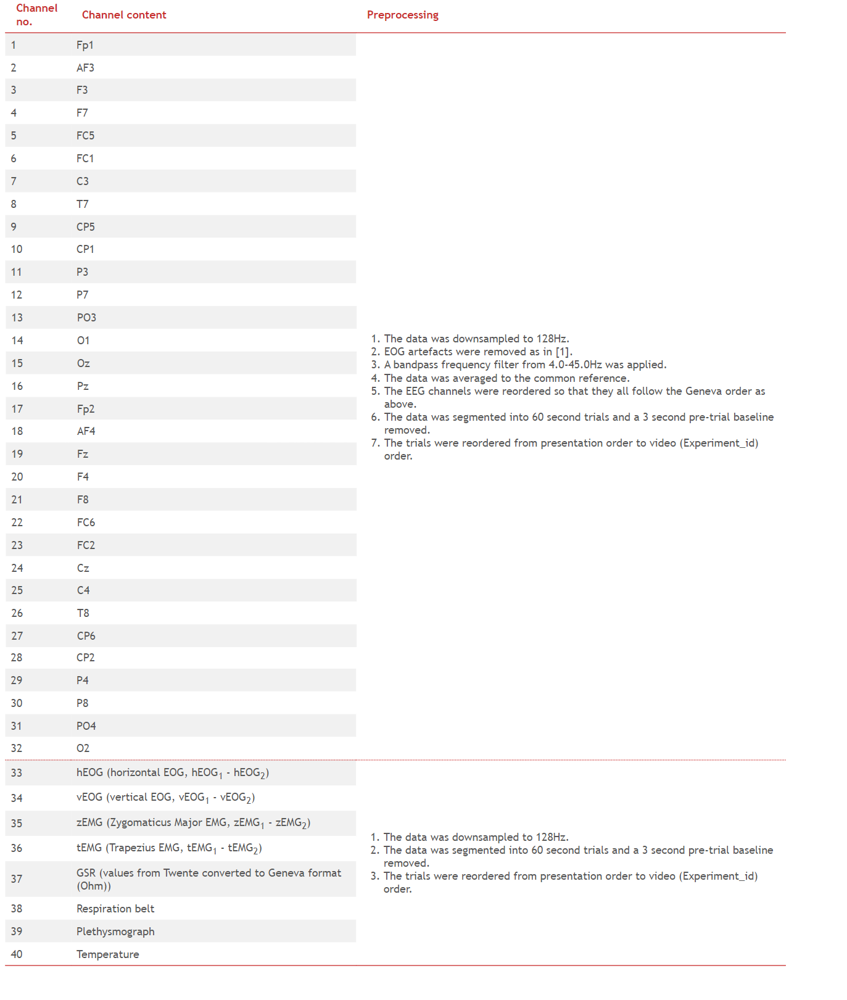

## Espacios Arousal - Valence

Cada uno de los 40 videos induce una emoción en los participantes, y como resultado, se les asigna una etiqueta correspondiente. Estas etiquetas se determinan considerando los modelos dimensionales de las emociones, los cuales sugieren que se comprenden mejor cuando se ubican en un espacio dimensional. Este espacio suele ser bidimensional y abarca dos aspectos principales: valencia y excitación. La valencia emocional se utiliza para describir el grado de positividad o negatividad de una emoción, mientras que la excitación se refiere a la intensidad, es decir, a la fuerza del estado emocional experimentado.

- **Excitación (arousal)**: El nivel de activación fisiológica o excitación experimentado en respuesta a un estímulo, que va desde bajo (tranquilo) hasta alto (intenso).

- **Valencia (valence)**: La cualidad emocional o positividad/negatividad de la experiencia subjetiva de un individuo, que va desde negativa (desagradable) hasta positiva (agradable).

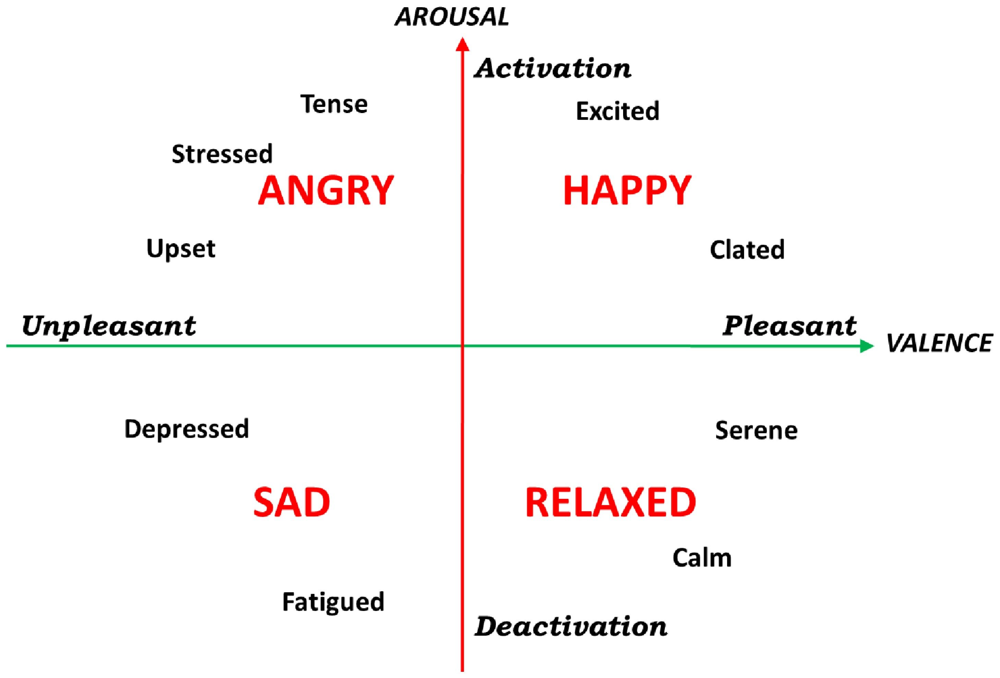

Recordemos que la base de datos DEAP está organizada como:

|Array name	|Array shape	|Array contents|
|-----------|-------------|--------------|
|data	|40 x 40 x 8064	|video/trial x channel x data|
|labels	|40 x 4	|video/trial x label (valence, arousal, dominance, liking)|

Las etiquetas se encuentran en el campo de "label":

En la matriz "labels", que tiene una estructura de 40 filas y 4 columnas, se organiza de la siguiente manera: "video/trial" en las filas y "label" en las columnas, donde se registran las valoraciones de valencia, excitación, dominancia y agradabilidad.

* **Valence:** Representa la puntuación de valencia, un número decimal entre 1 y 9.
* **Arousal:** Corresponde a la puntuación de excitación, también un número decimal entre 1 y 9.
* **Dominance:** Indica la puntuación de dominancia, un número decimal entre 1 y 9.
* **Liking:** Refleja la puntuación de agrado, que oscila entre 1 y 9.

In [ ]:
# Imprimir las etiquetas contenidas en la variable etiquetas1
print(etiquetas1)

[[8.22 7.78 4.   7.42]
 [6.05 7.9  5.06 5.01]
 [7.5  6.68 7.14 7.58]
 [7.38 6.72 6.18 6.94]
 [3.99 7.06 7.99 8.03]
 [7.19 6.83 6.55 7.67]
 [6.85 5.53 6.18 7.62]
 [7.   6.21 7.18 7.96]
 [7.69 7.44 8.42 8.92]
 [1.88 8.03 7.09 4.05]
 [8.03 4.26 5.73 7.85]
 [7.63 2.6  5.08 7.01]
 [6.79 3.19 3.88 6.85]
 [8.03 4.36 7.99 7.99]
 [7.08 3.37 5.14 7.17]
 [3.96 2.35 3.65 4.51]
 [6.06 3.32 6.28 6.04]
 [8.09 3.15 5.08 7.53]
 [7.55 5.92 6.06 5.23]
 [7.33 6.63 3.27 4.65]
 [1.03 6.09 1.94 3.78]
 [4.1  3.14 3.01 5.01]
 [2.41 5.95 2.69 6.96]
 [2.36 6.19 2.45 5.71]
 [3.87 3.09 3.06 6.36]
 [3.28 2.32 4.   6.77]
 [5.81 3.09 3.97 6.74]
 [2.53 2.96 2.1  6.  ]
 [2.92 5.96 3.24 6.53]
 [1.1  5.94 3.14 7.04]
 [3.26 6.49 6.27 5.82]
 [1.99 6.95 7.01 3.4 ]
 [3.18 5.83 3.81 2.9 ]
 [2.5  6.08 2.73 1.09]
 [2.68 6.17 3.68 3.49]
 [2.01 6.21 6.13 2.01]
 [3.47 5.96 4.04 2.4 ]
 [2.26 5.77 3.23 3.13]
 [6.65 7.06 7.78 2.78]
 [6.68 6.86 6.   5.23]]


### Gráfica del espacio emocional Arousal-Valence

Arousal Baja - Media y Alta
[1-3,4-6,7-9]

Valencia Baja - Media y Alta
[1-3,4-6,7-9]

**Para el sujeto 1**

Se extraerá y analizará las mediciones de Valencia y Arousal.

In [ ]:
# Extraer la columna Valence y Arousal de etiquetasX
Valence1 = etiquetas1[:,0]
Arousal1 = etiquetas1[:,1]

Valence2 = etiquetas2[:,0]
Arousal2 = etiquetas2[:,1]

Valence3 = etiquetas3[:,0]
Arousal3 = etiquetas3[:,1]

Valence4 = etiquetas4[:,0]
Arousal4 = etiquetas4[:,1]

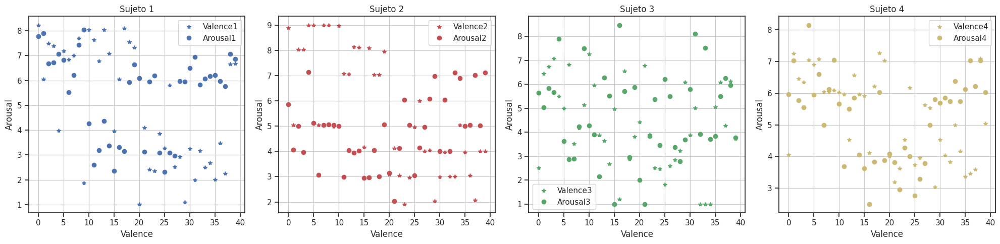

In [ ]:
# Crear un subplot de 1 fila y 4 columnas
fig, axs = plt.subplots(1, 4, figsize=(20, 5))

# Graficar los datos en cada subfigura, para el sujeto 1
axs[0].plot(Valence1, '*b', label="Valence1")
axs[0].plot(Arousal1, 'ob', label="Arousal1")
axs[0].set_title('Sujeto 1')
axs[0].set_xlabel('Valence')
axs[0].set_ylabel('Arousal')
axs[0].legend()
axs[0].grid()

# Graficar los datos en cada subfigura, para el sujeto 2
axs[1].plot(Valence2, '*r', label="Valence2")
axs[1].plot(Arousal2, 'or', label="Arousal2")
axs[1].set_title('Sujeto 2')
axs[1].set_xlabel('Valence')
axs[1].set_ylabel('Arousal')
axs[1].legend()
axs[1].grid()

# Graficar los datos en cada subfigura, para el sujeto 3
axs[2].plot(Valence3, '*g', label="Valence3")
axs[2].plot(Arousal3, 'og', label="Arousal3")
axs[2].set_title('Sujeto 3')
axs[2].set_xlabel('Valence')
axs[2].set_ylabel('Arousal')
axs[2].legend()
axs[2].grid()

# Graficar los datos en cada subfigura, para el sujeto 4
axs[3].plot(Valence4, '*y', label="Valence4")
axs[3].plot(Arousal4, 'oy', label="Arousal4")
axs[3].set_title('Sujeto 4')
axs[3].set_xlabel('Valence')
axs[3].set_ylabel('Arousal')
axs[3].legend()
axs[3].grid()

plt.tight_layout()
plt.legend()
plt.show()

Se grafican los planos Valence vs Arousal de los cuatro sujetos analizados para observar su comportamiento. Es posible apreciar como cada sujeto a lo largo de los 40 videos que pudo visualizar presentan diferentes variaciones en sus emociones, por analizar un caso específico el sujeto 4 es posible apreciar como pasaba de un estado de relajación a un estado de ira, estos cambios pueden darnos una idea de los tipos de video a los que fue expuesto el sujeto en cuestión.

### Extracción de características


Se toma una matriz de entrada X, que será nuestro set de datos por cada sujeto, que contiene valores de Valence y Arousal de emociones. Luego, se clasifica estas emociones en categorías específicas según sus valores de Valence y Arousal, asignando etiquetas a cada emoción. Las categorías incluyen emociones como Negativa, Neutral, Positiva, Estrés, Calma, Tristeza, Satisfecho, Tranquilidad y Sorpresa.

In [ ]:
def caracterizar_etiquetas(X):
    # Extraer las columnas Valence y Arousal de la matriz X
    Valence = X[:, 0]
    Arousal = X[:, 1]

    # Definir condiciones lógicas para diferentes categorías emocionales
    negA = np.logical_and(Arousal >= 1, Arousal <= 3)
    negV = np.logical_and(Valence >= 1, Valence <= 3)

    neutralA = np.logical_and(Arousal > 3, Arousal < 6)
    neutralV = np.logical_and(Valence > 3, Valence < 6)

    posA = Arousal >= 6
    posV = Valence >= 6

    # Crear una matriz de etiquetas vacía
    Etiquetas = np.empty((40, 1), dtype="U25")

    # Asignar etiquetas a las diferentes categorías emocionales
    Etiquetas[np.logical_and(neutralA, neutralV)] = "Neutral"   # Emocion Neutral neutralA y neutralV
    Etiquetas[np.logical_and(negA, negV)] = "Calmado"           # Emocion Negativa negA y negV
    Etiquetas[np.logical_and(posA, posV)] = "Excitado"          # Emocion Positiva posA y posV
    Etiquetas[np.logical_and(posA, negV)] = "Excitado"          # Emocion Stress posA y negV
    Etiquetas[np.logical_and(negA, posV)] = "Calmado"           # Emocion Calm negA y posV
    Etiquetas[np.logical_and(neutralA, negV)] = "Neutral"       # Emocion Tristeza neutralA y negV
    Etiquetas[np.logical_and(neutralA, posV)] = "Neutral"       # Emocion Satisfecho (Pleasant) neutralA y posV
    Etiquetas[np.logical_and(negA, neutralV)] = "Calmado"       # Emocion Tranquilidad negA y neutralV
    Etiquetas[np.logical_and(posA, neutralV)] = "Excitado"      # Emocion Sorpresa posA y neutralV

    return Etiquetas

Ahora, una vez definidas tanto las funciones de las características y de las etiquetas procedemos a hacer un ciclo para obtener las características asociadas a los 40 vídeos de los 4 pacientes.

In [ ]:
# Calcular las emociones para etiquetasX usando la función caracterizar_etiquetas
emociones1 = caracterizar_etiquetas(etiquetas1)
emociones2 = caracterizar_etiquetas(etiquetas2)
emociones3 = caracterizar_etiquetas(etiquetas3)
emociones4 = caracterizar_etiquetas(etiquetas4)

# Concatenar las emociones de los cuatro conjuntos de datos en una sola matriz
emociones = np.concatenate((emociones1, emociones2, emociones3, emociones4))

# Obtener las dimensiones de la matriz de emociones
emociones.shape

(160, 1)

In [ ]:
emociones

array([['Excitado'],
       ['Excitado'],
       ['Excitado'],
       ['Excitado'],
       ['Excitado'],
       ['Excitado'],
       ['Neutral'],
       ['Excitado'],
       ['Excitado'],
       ['Excitado'],
       ['Neutral'],
       ['Calmado'],
       ['Neutral'],
       ['Neutral'],
       ['Neutral'],
       ['Calmado'],
       ['Neutral'],
       ['Neutral'],
       ['Neutral'],
       ['Excitado'],
       ['Excitado'],
       ['Neutral'],
       ['Neutral'],
       ['Excitado'],
       ['Neutral'],
       ['Calmado'],
       ['Neutral'],
       ['Calmado'],
       ['Neutral'],
       ['Neutral'],
       ['Excitado'],
       ['Excitado'],
       ['Neutral'],
       ['Excitado'],
       ['Excitado'],
       ['Excitado'],
       ['Neutral'],
       ['Neutral'],
       ['Excitado'],
       ['Excitado'],
       ['Neutral'],
       ['Neutral'],
       ['Neutral'],
       ['Neutral'],
       ['Excitado'],
       ['Neutral'],
       ['Neutral'],
       ['Neutral'],
       ['Neutral'],


In [ ]:
emociones.shape = (160)

# Crear un diccionario para contar la frecuencia de cada emoción
frecuencia_emociones = {}

# Contar la frecuencia de cada emoción en la matriz de emociones
for emocion in emociones:
    if emocion in frecuencia_emociones:
        frecuencia_emociones[emocion] = frecuencia_emociones[emocion] + 1
    else:
        frecuencia_emociones[emocion] = 1

# Imprimir el diccionario de frecuencia de emociones
print(frecuencia_emociones)

{'Excitado': 48, 'Neutral': 93, 'Calmado': 19}


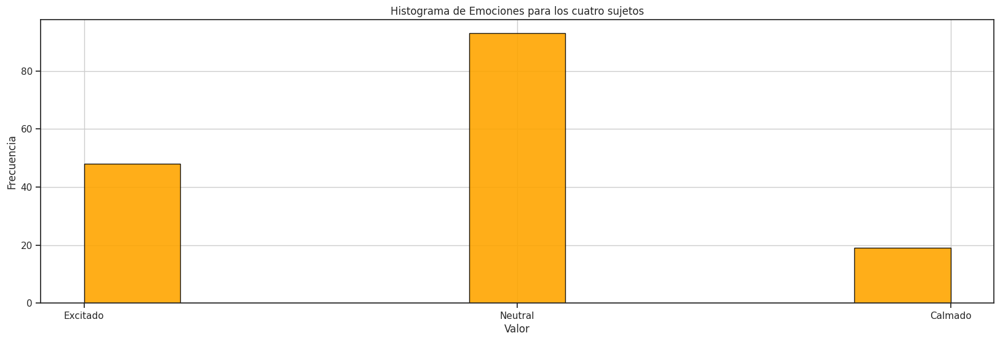

In [ ]:
# Crear un histograma de las emociones con 9 bins para visualizar la tendencia de forma más gráfica
plt.figure(figsize = (20, 6))  # Ajusta el tamaño de la figura.
plt.hist(emociones, bins=9, color='orange', alpha=0.9, edgecolor='black')
plt.xlabel('Valor')
plt.ylabel('Frecuencia')
plt.title('Histograma de Emociones para los cuatro sujetos')
plt.grid(True)
plt.show()

### **Extracción de características GSR**

Se realizan varios cálculos sobre una señal de respuesta galvánica de la piel (GSR), incluyendo la media de la señal, el promedio de su primera derivada, el promedio de la derivada para valores negativos, y la proporción de muestras negativas en la derivada, lo que proporciona información sobre la tendencia central, las fluctuaciones, aspectos emocionales y la asimetría de la señal, respectivamente. Estas características son útiles para analizar respuestas fisiológicas y emocionales en aplicaciones de monitorización psicofisiológica.

In [ ]:
def extraer_caracteristicas_GSR(X, canal):
  # Inicializar una lista para almacenar las características
  L = []

  # Obtener el canal de GSR especificado
  GSR = X[canal-1]

  # Media (mean) de GSR
  L.append(np.mean(GSR))

  # Promedio de la primera derivada
  diff = np.diff(GSR)
  L.append(np.mean(diff))

  # Promedio de la derivada solo para valores negativos
  aux = []
  for i in diff:
    if i < 0 :
      aux.append(i)
  L.append(np.mean(aux))

  # Proporción de muestras negativas en la derivada vs. todas las muestras
  L.append(len(aux)/len(diff))

  return L

### **Extracción de características Blood**

Se realiza cálculo de características a partir de una señal de sangre, utilizando una serie de cálculos que incluyen el promedio de la señal, la desviación estándar, y la potencia espectral en tres bandas de frecuencia diferentes (0.1 - 0.2 Hz, 0.2 - 0.3 Hz y 0.3 - 0.4 Hz). Estos cálculos proporcionan información relevante sobre la variabilidad y características específicas de la señal de sangre, lo que puede ser fundamental en aplicaciones de monitorización fisiológica y emocional para comprender la respuesta cardiovascular y el estado del sistema nervioso autónomo.

In [ ]:
def extraer_caracteristicas_Blood(X, L, canal):
  # Obtener el canal de Blood especificado
  Blood = X[canal-1]

  # Media (average) de Blood
  L.append(np.mean(Blood))

  # Desviación estándar (STD) de Blood
  L.append(np.std(Blood))

  # Potencia espectral en el rango de frecuencia 0.1 - 0.2 Hz
  b,a = scipy.signal.butter(2,(0.1/(128*0.5),0.2/(128*0.5)),btype="bandpass", analog=False)
  signal_filter = scipy.signal.lfilter(b,a,Blood)
  f, PSD = scipy.signal.welch(signal_filter, 128, nperseg=64)
  L.append(np.sum(PSD))

  # Potencia espectral en el rango de frecuencia 0.2 - 0.3 Hz
  b,a = scipy.signal.butter(2,(0.2/(128*0.5),0.3/(128*0.5)),btype="bandpass", analog=False)
  signal_filter = scipy.signal.lfilter(b,a,Blood)
  f, PSD = scipy.signal.welch(signal_filter, 128, nperseg=64)
  L.append(np.sum(PSD))

  # Potencia espectral en el rango de frecuencia 0.3 - 0.4 Hz
  b,a = scipy.signal.butter(2,(0.3/(128*0.5),0.4/(128*0.5)),btype="bandpass", analog=False)
  signal_filter = scipy.signal.lfilter(b,a,Blood)
  f, PSD = scipy.signal.welch(signal_filter, 128, nperseg=64)
  L.append(np.sum(PSD))

  return L

### **Extracción de características Respiration**

Se calculan características a partir de una señal de respiración, realizando los siguientes cálculos: el promedio de la señal de respiración, la media de su derivada, la desviación estándar de la señal y la relación de energía en dos bandas de frecuencia específicas (0.05 - 0.25 Hz y 0.25 - 5 Hz). Estos cálculos proporcionan información relevante sobre la regularidad de la respiración, la variabilidad y características relacionadas con la respuesta fisiológica y emocional. Estas características son fundamentales en aplicaciones de monitorización psicofisiológica y análisis de la función respiratoria.

In [ ]:
def extraer_caracteristicas_Respiration(X, L, canal):
  # Obtener el canal de Respiración especificado
  Respiration=X[canal-1]

  # Media (average) de Respiración
  L.append(np.mean(Respiration))

  # Media de la derivada (mean derivate) de Respiración
  L.append(np.mean(np.diff(Respiration)))

  # Desviación estándar (STD) de Respiración
  L.append(np.std(Respiration))

  # Ratio de energía en bandas de frecuencia
  b,a = scipy.signal.butter(2,(0.05/(128*0.5),0.25/(128*0.5)),btype="bandpass", analog=False)
  signal_filter_low = scipy.signal.lfilter(b,a,Respiration)
  f, PSD = scipy.signal.welch(signal_filter_low, 128, nperseg=64)
  pot_low=20*np.log(np.sum(PSD))

  b,a = scipy.signal.butter(2,(0.25/(128*0.5),5/(128*0.5)),btype="bandpass", analog=False)
  signal_filter_high = scipy.signal.lfilter(b,a,Respiration)
  f, PSD = scipy.signal.welch(signal_filter_high, 128, nperseg=64)
  pot_high=20*np.log(np.sum(PSD))

  L.append(pot_low-pot_high)

  return L

### **Extracción de características Skin Temperature**

Se realizan cálculos sobre una señal de respuesta de la piel (Skin) y extrae características que incluyen el promedio de la señal, la media de su derivada, y la potencia espectral en dos bandas de frecuencia específicas (0 - 0.1 Hz y 0.1 - 0.2 Hz). Estos cálculos proporcionan información clave sobre la actividad eléctrica de la piel y sus variaciones, lo que puede ser valioso en aplicaciones de análisis emocional y fisiológico para comprender las respuestas de la piel ante estímulos y situaciones específicas.

In [ ]:
def extraer_caracteristicas_Skin(X, L, canal):
  # Obtener el canal de Skin especificado
  Skin = X[canal-1]

  # Media (average) de Skin
  L.append(np.mean(Skin))

  # Media de la derivada (mean derivate) de Skin
  L.append(np.mean(np.diff(Skin)))

  # Potencia espectral en el rango de frecuencia 0 - 0.1 Hz
  b,a = scipy.signal.butter(4,0.1/(128*0.5),btype="lowpass", analog=False)
  signal_filter = scipy.signal.lfilter(b,a,Skin)
  f, PSD = scipy.signal.welch(signal_filter, 128, nperseg=64)
  L.append(np.sum(PSD))

  # Potencia espectral en el rango de frecuencia 0.1 - 0.2 Hz
  b,a = scipy.signal.butter(2,(0.1/(128*0.5),0.2/(128*0.5)),btype="bandpass", analog=False)
  signal_filter = scipy.signal.lfilter(b,a,Skin)
  f, PSD = scipy.signal.welch(signal_filter, 128, nperseg=64)
  L.append(np.sum(PSD))

  return L

### **Extracción de características EMG_EOG**

Se calculan características a partir de señales de electromiografía (EMG) y electrooculografía (EOG), realizando los siguientes cálculos para cada canal correspondiente (del 32 al 35): el promedio de la señal, la varianza y la energía. Estas características son fundamentales para evaluar la actividad eléctrica de los músculos y el movimiento ocular, y pueden ser utilizadas en aplicaciones de monitorización neuromuscular y seguimiento ocular para comprender la actividad fisiológica y la respuesta a estímulos específicos.

In [ ]:
def extraer_caracteristicas_EMG_EOG(X, L):
  for canal in range(32,36):

    # Media (Mean) del canal actual
    L.append(np.mean(X[canal]))

    # Varianza (Variance) del canal actual
    L.append(np.var(X[canal]))

    # Energía (Energy) del canal actual
    L.append(np.sum(np.square(X[canal])))

  return L

### **Extracción de características EEG**

Se realizan cálculos sobre señales de electroencefalografía (EEG) con el fin de extraer características informativas. Incluye el cálculo de características para los 32 canales EEG, que abarcan cinco bandas de frecuencia (delta, theta, alpha, beta y gamma) utilizando funciones previamente definidas, así como también calcula características para las diferencias entre canales específicos. Estas características proporcionan una comprensión detallada de la actividad cerebral en diferentes rangos de frecuencia, lo que es crucial en aplicaciones de análisis neurológico y cognitivo para evaluar patrones y cambios en la actividad cerebral.

In [ ]:
def delta(X):
  # Filtrar la señal en el rango de frecuencia 0.5 - 3.5 Hz
  b,a = scipy.signal.butter(2,(0.5/(128*0.5),3.5/(128*0.5)),btype="bandpass", analog=False)
  signal_filter = scipy.signal.lfilter(b,a,X)

  # Calcular la densidad espectral de potencia (PSD)
  f, PSD = scipy.signal.welch(signal_filter, 128, nperseg=64)

  # Sumar la PSD para obtener un valor delta
  return np.sum(PSD)

In [ ]:
def theta(X):
  # Filtrar la señal en el rango de frecuencia 4 - 7 Hz (banda theta)
  b,a = scipy.signal.butter(2,(4/(128*0.5),7/(128*0.5)),btype="bandpass", analog=False)
  signal_filter = scipy.signal.lfilter(b,a,X)

  # Calcular la densidad espectral de potencia (PSD)
  f, PSD = scipy.signal.welch(signal_filter, 128, nperseg=64)

  # Sumar la PSD para obtener un valor theta
  return np.sum(PSD)

In [ ]:
def alpha(X):
  # Filtrar la señal en el rango de frecuencia 8 - 13 Hz (banda alpha)
  b,a = scipy.signal.butter(2,(8/(128*0.5),13/(128*0.5)),btype="bandpass", analog=False)
  signal_filter = scipy.signal.lfilter(b,a,X)

  # Calcular la densidad espectral de potencia (PSD)
  f, PSD = scipy.signal.welch(signal_filter, 128, nperseg=64)

  # Sumar la PSD para obtener un valor alpha
  return np.sum(PSD)

In [ ]:
def beta(X):
  # Filtrar la señal en el rango de frecuencia 15 - 28 Hz (banda beta)
  b,a = scipy.signal.butter(2,(15/(128*0.5),28/(128*0.5)),btype="bandpass", analog=False)
  signal_filter = scipy.signal.lfilter(b,a,X)

  # Calcular la densidad espectral de potencia (PSD)
  f, PSD = scipy.signal.welch(signal_filter, 128, nperseg=64)

  # Sumar la PSD para obtener un valor beta
  return np.sum(PSD)

In [ ]:
def gamma(X):
  # Filtrar la señal en el rango de frecuencia 30 - 60 Hz (banda gamma)
  b,a = scipy.signal.butter(2,(30/(128*0.5),60/(128*0.5)),btype="bandpass", analog=False)
  signal_filter = scipy.signal.lfilter(b,a,X)

  # Calcular la densidad espectral de potencia (PSD)
  f, PSD = scipy.signal.welch(signal_filter, 128, nperseg=64)

  # Sumar la PSD para obtener un valor gamma
  return np.sum(PSD)

In [ ]:
def extraer_caracteristicas_EEG(X,L):
  # Extraer características de los 32 canales EEG
  for canal in range(0,32):
    L.append(delta(X[canal]))
    L.append(theta(X[canal]))
    L.append(alpha(X[canal]))
    L.append(beta(X[canal]))
    L.append(gamma(X[canal]))

  # Eliminar canales específicos (14, 15, 18, 23) de X
  x = np.delete(X,(14,15,18,23),0)

  # Extraer características de los 14 canales EEG restantes
  for canal in range(0,14):
    aux = x[canal]-x[canal+14]
    L.append(delta(aux))
    L.append(theta(aux))
    L.append(alpha(aux))
    L.append(beta(aux))
    L.append(gamma(aux))

  return L

# Caracterizador DEAP

In [ ]:
def Caracterizador_DEAP(X):
  caracteristicas = extraer_caracteristicas_GSR(X, canal_GSR)
  caracteristicas = extraer_caracteristicas_Blood(X, caracteristicas, canal_plethysmograph)
  caracteristicas = extraer_caracteristicas_Respiration(X, caracteristicas, canal_respiracion)
  caracteristicas = extraer_caracteristicas_Skin(X, caracteristicas, canal_temperatura)
  caracteristicas = extraer_caracteristicas_EMG_EOG(X, caracteristicas)
  caracteristicas = extraer_caracteristicas_EEG(X,caracteristicas)

  caracteristicas = np.array(caracteristicas)

  return caracteristicas

In [ ]:
caracteristicas = []                                  # Inicialización de una lista donde irán las características

for video in signals1:                                # Ciclo que recorre cada uno de los vídeos por usuario
  caracteristicas.append(Caracterizador_DEAP(video))  # Agregamos las características de cada vídeo a la lista caracteristicas

for video in signals2:                                # Ciclo que recorre cada uno de los vídeos por usuario
  caracteristicas.append(Caracterizador_DEAP(video))  # Agregamos las características de cada vídeo a la lista caracteristicas

for video in signals3:                                # Ciclo que recorre cada uno de los vídeos por usuario
  caracteristicas.append(Caracterizador_DEAP(video))  # Agregamos las características de cada vídeo a la lista caracteristicas

for video in signals4:                                # Ciclo que recorre cada uno de los vídeos por usuario
  caracteristicas.append(Caracterizador_DEAP(video))  # Agregamos las características de cada vídeo a la lista caracteristicas

La matriz de características tendrá la forma (160, 259), con 160 muestras diferentes (40 por cada uno de los 4 sujetos del set de datos) y a cada una se le extrajo 259 características

In [ ]:
features = np.array(caracteristicas)                  # Volvemos la matriz caracteristicas en un tipo array

In [ ]:
scaler = StandardScaler()                             # Crear una instancia del escalador StandardScaler
scaler.fit(features)                                  # Ajustar el escalador a las características
features = scaler.transform(features)                 # Transformar las características utilizando el escalador

In [ ]:
features.shape                                        # Obtener la forma de la matriz de características después del escalado

(160, 259)

In [ ]:
data = pd.DataFrame(features)                         # Creamos el DataFrame con las caractarísticas normalizadas
data['Labels'] = emociones                            # en la columba "Labels" agregamos las etiquetas de las emociones234567890'¿}

In [ ]:
data.shape                                            # Obtener la forma de la matriz de datos consolidados

(160, 260)

In [ ]:
data                                                  # Imprimir en pantalla el Dataframe

,0,1,2,3,4,5,6,7,8,9,...,250,251,252,253,254,255,256,257,258,Labels
0,-3.014913,-5.239230,-1.980598,1.400022,-0.918646,1.143106,5.817433,3.094144,1.234671,0.661818,...,0.011656,0.320628,2.496814,2.765625,-0.471639,-0.492489,-0.356538,0.037548,0.076219,Excitado
1,-1.608333,-2.417379,-1.670440,0.201023,0.035701,1.325445,2.316506,0.837677,0.102427,0.202343,...,0.496391,0.284334,0.316130,-0.001692,-0.242231,-0.267863,-0.350072,-0.307057,-0.297331,Excitado
2,-0.468652,-0.099025,0.507492,0.307443,-0.494695,-0.140608,0.040595,-0.221596,-0.140321,-0.219140,...,0.150076,0.092651,0.687314,1.135435,-0.457419,-0.453987,-0.464666,-0.225788,-0.106181,Excitado
3,0.267802,-0.036829,-0.024582,-0.242394,0.483081,1.725078,1.639448,0.476965,0.074906,0.441885,...,0.356673,0.579158,1.092149,0.727573,-0.413491,-0.395839,-0.379221,-0.233033,-0.212036,Excitado
4,-0.835906,-1.092877,-0.457090,1.495800,2.285590,0.930672,1.554443,3.718520,0.282797,0.101783,...,5.271019,3.967720,0.922128,0.083474,1.350531,1.421749,0.662367,-0.303955,-0.308500,Excitado
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
155,0.529496,0.434118,0.747293,-1.150511,0.195854,-1.000649,-0.797397,-0.415094,-0.279784,0.226372,...,-0.531319,-0.469988,-0.777294,-0.732916,-0.681921,-0.720569,-0.929302,-0.535295,-0.403515,Excitado
156,0.189059,0.496744,0.460206,-0.916387,0.604783,0.368042,-0.040622,-0.133332,0.039528,-0.077397,...,-0.424782,-0.449738,-0.798179,-0.783108,-0.588433,-0.615994,-0.825785,-0.526399,-0.404930,Excitado
157,0.935928,1.032202,0.641410,-1.494603,0.613041,-1.098360,-0.825049,-0.592798,-0.253093,0.032746,...,-0.431685,-0.562355,-0.803731,-0.758792,-0.580137,-0.604779,-0.765813,-0.512353,-0.398561,Excitado
158,-0.621761,-0.581736,0.416602,1.329075,-0.468086,0.442676,0.380068,-0.489448,-0.185818,0.758232,...,-0.394973,-0.474057,-0.617866,-0.569723,-0.579718,-0.588743,-0.742401,-0.533460,-0.396239,Excitado


1. **Número de componentes = 2:**

  Graficar las características proyectadas a un espacio de dos componentes principales. Utilice un color diferente para cada estado emocional (Calmado, Neutral, Excitado). ¿Qué beneficio tiene expresar los datos en este espacio de dimensión reducida?, argumente su respuesta.


In [ ]:
caracteristicas = data.iloc[:, :-1]  # Todas las columnas excepto la última
etiquetas = data['Labels']

In [ ]:
# Normalizar
scaler = StandardScaler()
caracteristicas_normalizadas = scaler.fit_transform(caracteristicas)

In [ ]:
# PCA con 2 componentes principales
pca2 = PCA(n_components=2)
componentes_principales2 = pca2.fit_transform(caracteristicas_normalizadas)

# Nuevo DataFrame con los componentes principales y las etiquetas
df_pca2 = pd.DataFrame(data=componentes_principales2, columns=["Componente 1", "Componente 2"])
df_pca2["Labels"] = etiquetas

In [ ]:
colores = {
              "Calmado": "blue",
              "Neutral": "green",
              "Excitado": "red"
          }

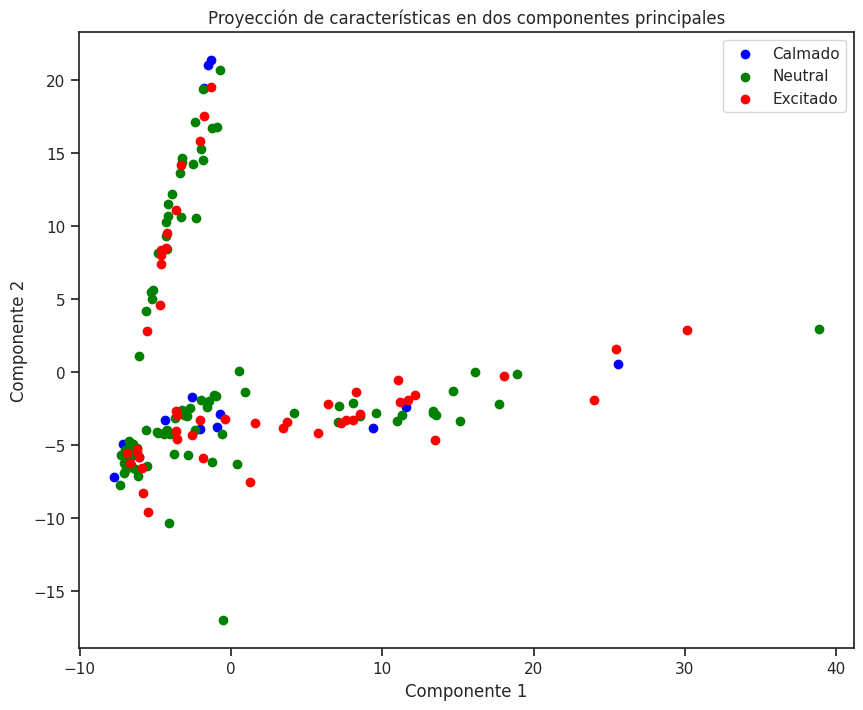

In [ ]:
plt.figure(figsize=(10, 8))
for emocion, color in colores.items():
    subset = df_pca2[df_pca2["Labels"] == emocion]
    plt.scatter(subset["Componente 1"], subset["Componente 2"], label=emocion, color=color)

plt.xlabel("Componente 1")
plt.ylabel("Componente 2")
plt.title("Proyección de características en dos componentes principales")
plt.legend(loc="best")
plt.show()

El beneficio de expresar los datos en un espacio de dimensión reducida (en este caso, dos componentes principales) es la capacidad de visualizar y explorar las relaciones entre los datos de una manera más manejable. Al reducir el número de componentes es posible observar patrones y tendencias de manera más efectiva y entender cómo se agrupan o separan los diferentes estados emocionales. Esto facilita la interpretación de los datos.

2. **Número de componentes = 5:**

  Utilice pair plots para graficar las características proyectadas al espacio de componentes principales de dimensión 5. ¿Para qué pares de componentes se generan grupos o clusters distintivos para cada uno de los tres estados emocionales  (calmado, neutral, excitado)?. Analice y discuta los resultados.

In [ ]:
# PCA con 5 componentes principales
pca5 = PCA(n_components=5)
componentes_principales5 = pca5.fit_transform(caracteristicas_normalizadas)

# Nuevo DataFrame con los componentes principales y las etiquetas
df_pca5 = pd.DataFrame(data=componentes_principales5, columns=["Componente 1", "Componente 2", "Componente 3", "Componente 4", "Componente 5"])
df_pca5["Labels"] = etiquetas

### Blood vs Skin temperature

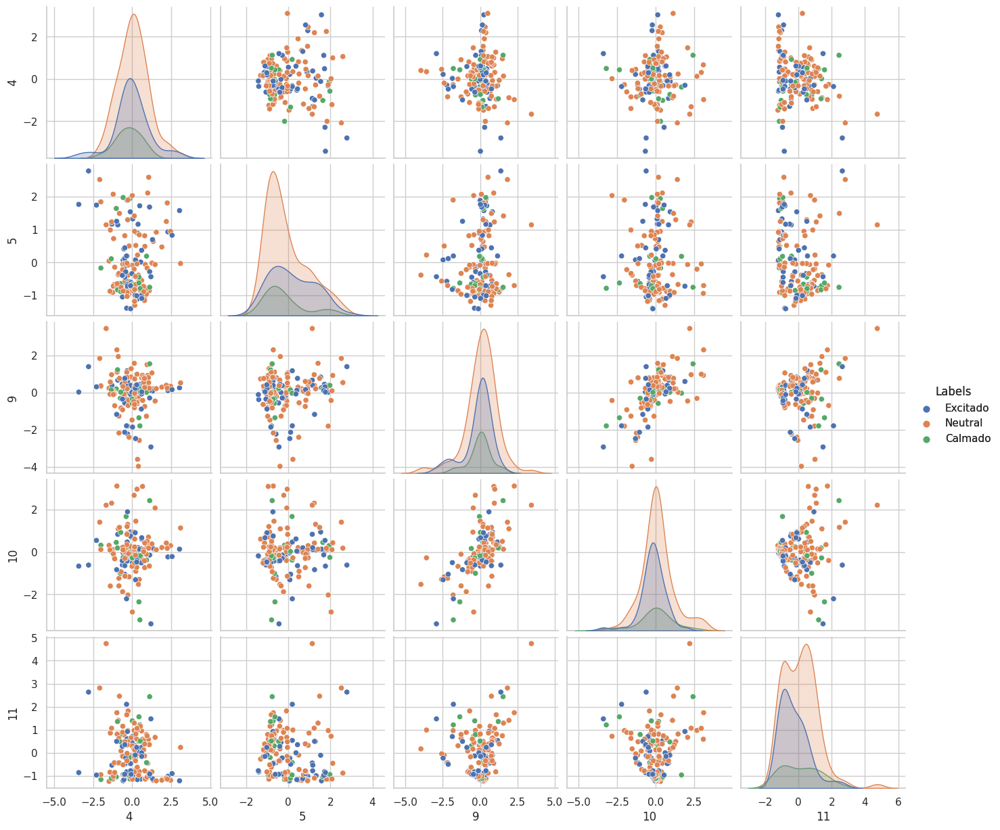

In [ ]:
g = sns.pairplot(data, vars = data.iloc[:,[4,5,9,10,11]], hue = 'Labels')
g.add_legend()

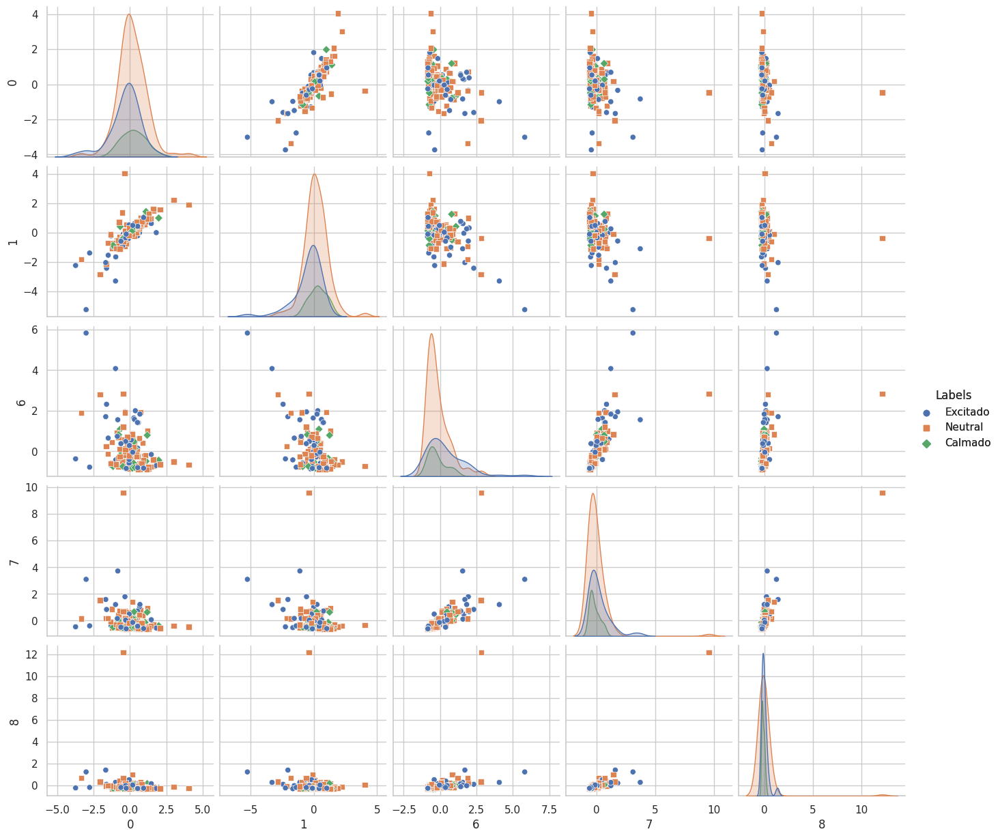

In [ ]:
g = sns.pairplot(data, vars = data.iloc[:,[0,1,6,7,8]], hue = 'Labels', markers=["o", "s", "D"])
g.add_legend()

## GSR vs Skin Temperature

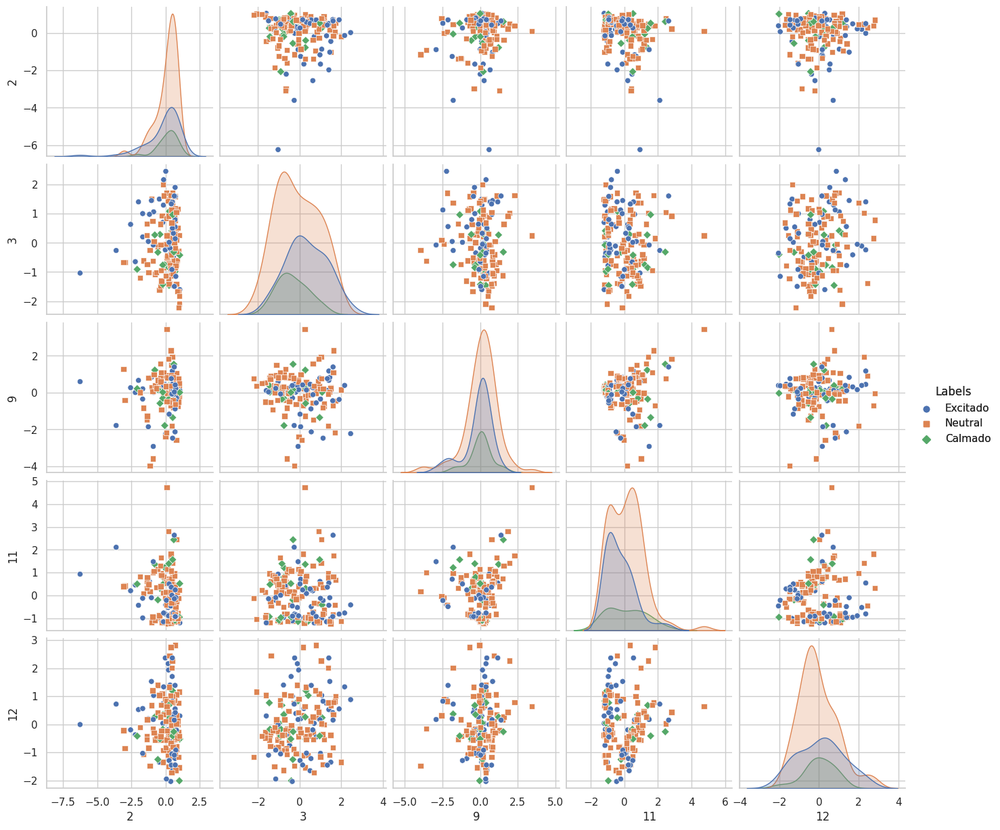

In [ ]:
g = sns.pairplot(data, vars = data.iloc[:,[2,3,9,11,12]], hue = 'Labels', markers=["o", "s", "D"])
g.add_legend()

## EMG vs EOG

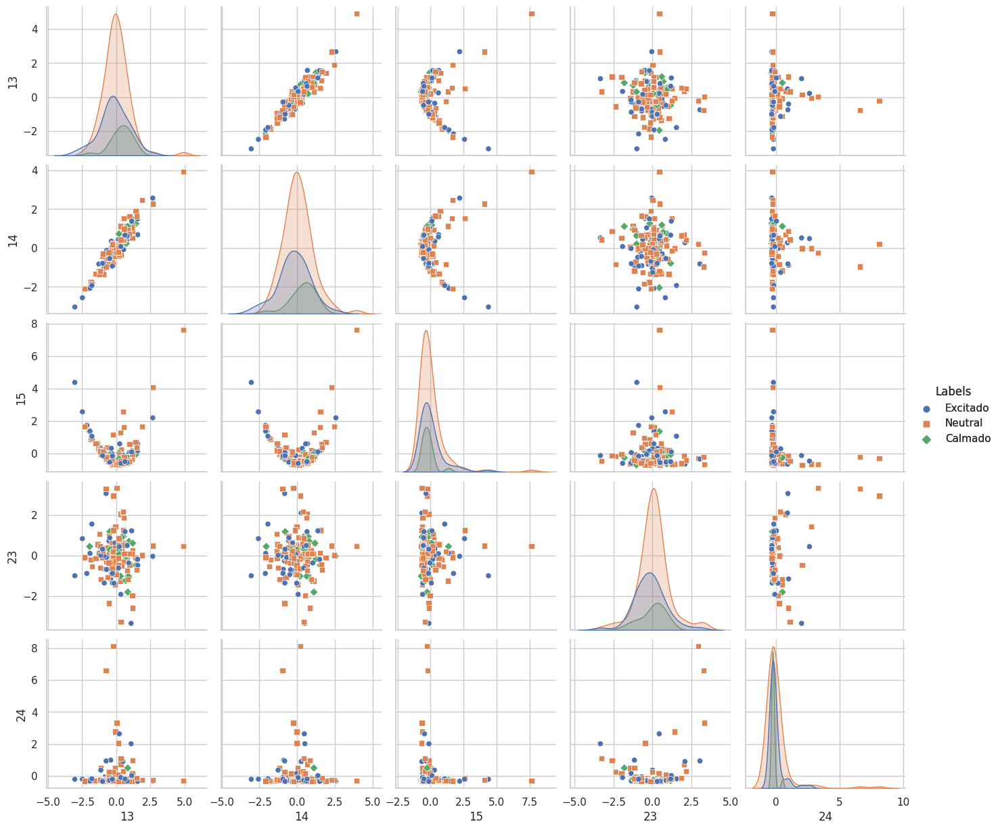

In [ ]:
g = sns.pairplot(data, vars = data.iloc[:,[13,14,15,23,24]],hue = 'Labels', markers=["o", "s", "D"])
g.add_legend()

## EEG

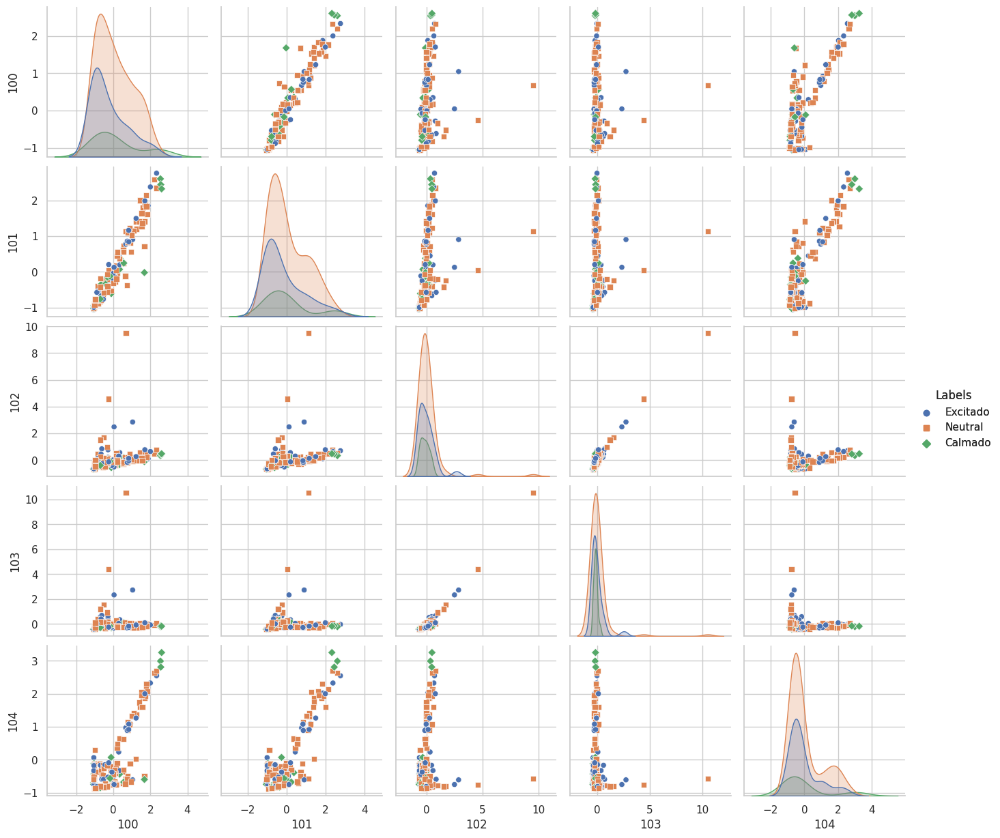

In [ ]:
g = sns.pairplot(data, vars = data.iloc[:,[100,101,102,103,104]],hue = 'Labels', markers=["o", "s", "D"])
g.add_legend()

3. **Número de componentes = número de características:**
  
  Haga un análisis de varianza y determine cuántos componentes son necesarios para preservar el 90% de la varianza presente en los datos. ¿En qué porcentaje se redujo la dimensionalidad?, ¿qué beneficios tiene esta reducción?. Argumente.

In [ ]:
# Normalizar
caracteristicas = data.drop('Labels', axis=1)
scaler = StandardScaler()
caracteristicas_normalizadas = scaler.fit_transform(caracteristicas)

In [ ]:
# PCA con el número de componentes igual al número de características
pca = PCA(n_components=160)
pca.fit(caracteristicas_normalizadas)

PCA(n_components=160)

In [ ]:
varianza_explicada = pca.explained_variance_ratio_
varianza_acumulada = np.cumsum(varianza_explicada)

# Encuentra el número de componentes necesarios para alcanzar el 90% de varianza
num_componentes_90 = np.argmax(varianza_acumulada >= 0.9) + 1
porcentaje_reduccion = 100 - (num_componentes_90 / caracteristicas_normalizadas.shape[1] * 100)

# Resultados
print(f"Número de componentes necesarios para preservar el 90% de la varianza: {num_componentes_90}")
print(f"Porcentaje de reducción de dimensionalidad: {porcentaje_reduccion:.2f}%")

Número de componentes necesarios para preservar el 90% de la varianza: 11
Porcentaje de reducción de dimensionalidad: 95.75%


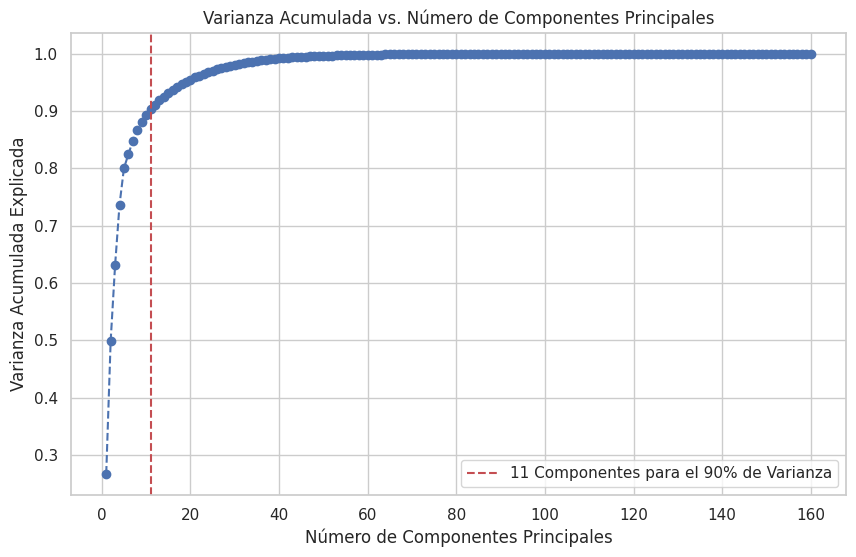

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(np.arange(1, len(varianza_acumulada) + 1), varianza_acumulada, marker='o', linestyle='--')
plt.xlabel('Número de Componentes Principales')
plt.ylabel('Varianza Acumulada Explicada')
plt.title('Varianza Acumulada vs. Número de Componentes Principales')
plt.axvline(x=num_componentes_90, color='r', linestyle='--', label=f'{num_componentes_90} Componentes para el 90% de Varianza')
plt.legend()
plt.grid(True)
plt.show()

Los beneficios de esta reducción de dimensionalidad se traducen en la simplificación de los datos, la aceleración del procesamiento, la reducción de la maldición de la dimensionalidad y una mejor interpretación de los datos.

## **Conclusiones**

- Al proyectar las características en un espacio de dos componentes principales utilizando PCA, podemos visualizar los datos en un plano bidimensional. Asignar colores diferentes a cada estado emocional (calmado, neutral, excitado) nos permite observar la distribución de los datos y cómo se agrupan según sus estados emocionales. La representación en este espacio de dimensión reducida facilita la interpretación y la identificación de patrones en los datos. La ventaja principal de expresar los datos en este espacio es la capacidad de reducir la complejidad y la dimensionalidad del conjunto de datos original, manteniendo una representación significativa de la estructura subyacente. Sin embargo se sigue necesitando mas apoyo de otras cualidades o herramientas para poder diferenciar y distribuir mejor la clasificacion de las emociones.

- Al utilizar 5 componentes principales y generar pair plots para visualizar la proyección de las características en este espacio, podemos identificar combinaciones de componentes que muestran grupos o clusters distintivos para cada uno de los tres estados emocionales (calmado, neutral, excitado). Estos clusters indican cómo ciertos pares de componentes capturan la variabilidad asociada con los diferentes estados emocionales. Este enfoque nos permite entender qué características están más relacionadas con cada estado emocional y cómo se pueden agrupar en este espacio de dimensionalidad reducida, pero ademas se sigue necesitando mas información para poder generar los pair plots correctamente y poder optener diferencias de agraupamientos. El Análisis de Componentes Principales (PCA) es una técnica eficaz para reducir la dimensionalidad de conjuntos de datos multivariados al identificar las componentes principales que explican la mayor parte de la variabilidad presente en los datos. Al hacerlo, se logra simplificar la representación de los datos sin una pérdida significativa de información. Esta reducción en la dimensionalidad tiene ventajas importantes en términos de almacenamiento, facilita la visualización y simplifica el análisis, lo que resulta fundamental en diversas aplicaciones..

- Al realizar un análisis de varianza y determinar cuántos componentes son necesarios para preservar el 90% de la varianza presente en los datos, estamos identificando la cantidad óptima de componentes que retienen la información más relevante. Reducir la dimensionalidad manteniendo el 90% de la varianza puede ofrecer una significativa reducción en la cantidad de características, lo que simplifica el análisis y procesamiento de los datos. Esta reducción puede mejorar la eficiencia computacional y reducir el riesgo de sobreajuste. Además, al mantener la mayoría de la varianza, podemos confiar en que hemos conservado la estructura y la información esencial del conjunto de datos, lo que puede llevar a un mejor rendimiento en tareas posteriores como clasificación o clustering.